<a href="https://colab.research.google.com/github/thxsxth/POMDP_RLSepsis/blob/master/Full_Analysis_of_Distributional_DQN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
cd 'drive/My Drive/sepsis3-cohort'


/content/drive/My Drive/sepsis3-cohort


# This Notebook describes the analysis after all the models are trained, This is rather long but it's recommended to open in google colab, and then you can navigate using the Table of contents

In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [2]:
import torch
import numpy as np
import pandas as pd
import datetime as dt
import random
import time
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset,DataLoader
import torch.nn.functional as F
import os
import glob
import copy

import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device='cuda' if torch.cuda.is_available() else 'cpu'
print('Done')


Done


## Imports

In [3]:
df=pd.read_csv('RL_new.csv')
df=df.iloc[:,1:]
print('Loaded')
df['SOFA_']=df.SOFA
df['SV_']=df.SV
df['SV_C']=(df.SV_/df.C)
df['CO']=(df.SV*df.HR)
df['CO_C']=df.CO/df.C
df['(CO)R']=df.CO*df.R


df['SV_C']=(df['SV_C']-df['SV_C'].mean())/(df['SV_C'].std())
df['CO']=(df['CO']-df['CO'].mean())/(df['CO'].std())
df['CO_C']=(df['CO_C']-df['CO_C'].mean())/(df['CO_C'].std())
df['(CO)R']=(df['(CO)R']-df['(CO)R'].mean())/(df['(CO)R'].std())
df['R_']=(df['R']-df['R'].mean())/(df['R'].std())
df['C_']=(df['C']-df['C'].mean())/(df['C'].std())


Loaded


In [ ]:
df.head()

### Processing

In [4]:
df['SV/C']=df['SV_C']
df['CO/C']=df['CO_C']
df['RC']=df['R']*df['C']
df['SV_R']=df['R']*df['SV_']
df['(SV)R']=(df['SV_R']-df['SV_R'].mean())/df['SV_R'].std()

In [5]:
temp=df.describe()
means=temp.loc['mean'].values
stds=temp.loc['std'].values

cols=[0,1,2,3,4,5,6,7,11,37,38,40]

df.iloc[:,cols]=(df.iloc[:,cols]-means[cols])/stds[cols]
print('Normalized')

Normalized


In [7]:
def get_actions(df):
  df['Fluids']=df['Fluids'].apply(lambda x:max(x,0))
  Vaso_cuts,vaso_bins=pd.cut(df['Vaso'],bins=[-1e-6,1e-8/2,0.15,np.inf],labels=False,retbins=True)

  df['Vaso_cuts']=Vaso_cuts.values
  Fluids_cuts,fluid_bins=pd.cut(df['Fluids'],bins=[-1e-6,6.000000e-03/2,5.000000e+01,np.inf],labels=False,retbins=True)

  df['Fluid_cuts']=Fluids_cuts.values
  df['Fluid_cuts'].value_counts(normalize=True),df['Vaso_cuts'].value_counts(normalize=True)

  all_acts=np.arange(9).reshape(3,3)


  df['action']=all_acts[df.Vaso_cuts,df.Fluid_cuts]


get_actions(df)

## Distributional

### Classses and helper Functions

In [8]:

class DistributionalDQN(nn.Module):
    def __init__(self, state_dim, n_actions, N_ATOMS):
        super(DistributionalDQN, self).__init__()

        self.input_layer=nn.Linear(state_dim,512)
        self.n_atoms=N_ATOMS
        self.hiddens=nn.ModuleList([ nn.Sequential(
            nn.Linear(512, 512),
            nn.ReLU()) for _ in range(5) ])
        
       
        self.out=nn.Linear(512, n_actions * N_ATOMS)
       
  

    def forward(self, state):
        batch_size =state.size()[0]
        out=self.input_layer(state)

        for layer in self.hiddens:
          out=layer(out)
        
        out=self.out(out)
        
        return F.softmax(out.view(batch_size, -1, self.n_atoms),dim=2),F.log_softmax(out.view(batch_size, -1,self.n_atoms), dim = -1)


In [9]:
class dist_DQN(object):
  def __init__(self,
               num_actions=9,
               state_dim=41,
               v_max=20,
               v_min=-20,
               device='cpu',
               gamma=0.999,
               tau=0.005,
               n_atoms=51
               ):
    self.device=device
    self.Q =DistributionalDQN(state_dim, num_actions,n_atoms).to(self.device)
    self.Q_target=copy.deepcopy(self.Q)
    self.optimizer=torch.optim.Adam(self.Q.parameters(),lr=1e-5)

    self.tau = tau
    self.gamma=gamma
    self.v_min=v_min
    self.v_max=v_max

    self.num_actions = num_actions
    self.atoms=n_atoms
    self.supports = torch.linspace(self.v_min, self.v_max, self.atoms).view(1, 1, self.atoms).to(self.device)
    self.delta = (self.v_max - self.v_min) / (self.atoms - 1)




  def train_epoch(self,data_loader,it=0):

    sum_q_loss=0
    for i,(state,next_state,action,reward,done) in enumerate(data_loader):

      batch_size=state.shape[0]
      action=torch.LongTensor(action.reshape(batch_size,1)).to(device)
      reward=torch.FloatTensor(reward.reshape(batch_size,1).cpu().numpy()).to(device)
      done=done.reshape(batch_size,1).to(device)

      batch=(state,next_state,action,reward,done)
      loss=self.compute_loss(batch)
      # print(loss.item())
      sum_q_loss+=loss.item()
       
	    
      if i%25==0:
        print('Epoch :',it,'Batch :', i,'Average Loss :',sum_q_loss/(i+1))


      self.optimizer.zero_grad()
      loss.backward()

      self.optimizer.step()
      self.polyak_target_update()


  def polyak_target_update(self):
     for param, target_param in zip(self.Q.parameters(), self.Q_target.parameters()):
        target_param.data.copy_(self.tau * param.data + (1 - self.tau) * target_param.data)


  def compute_loss(self,batch):

     state,next_state,action,reward,done=batch  
     batch_size=state.shape[0]
     range_batch = torch.arange(batch_size).long().to(device)
     action = action.long()

     z_dist = torch.from_numpy(np.array([[self.v_min + i*self.delta for i in range(self.atoms)]]*batch_size)).to(device)
     z_dist = torch.unsqueeze(z_dist, 2).float() 

     _, log_Q_dist_prediction = self.Q(state)
     log_Q_dist_prediction = log_Q_dist_prediction[range_batch, action.squeeze(1), :]

     with torch.no_grad():
        Q_dist_target, _ = self.Q_target(next_state)
 
     Q_target = torch.matmul(Q_dist_target, z_dist).squeeze(1)
     a_star = torch.argmax(Q_target, dim=1)
     Q_dist_star = Q_dist_target[range_batch, a_star.squeeze(1),:]

     m = torch.zeros(batch_size,self.atoms).to(device)

     for j in range(self.atoms):
         T_zj = torch.clamp(reward + self.gamma * (1-done) * (self.v_min + j*self.delta), min = self.v_min, max = self.v_max)
            
         bj = (T_zj - self.v_min)/self.delta
         l = bj.floor().long()
         u = bj.ceil().long()

         mask_Q_l = torch.zeros(m.size()).to(device)
         mask_Q_l.scatter_(1, l, Q_dist_star[:,j].unsqueeze(1))
            
         mask_Q_u = torch.zeros(m.size()).to(device)
         mask_Q_u.scatter_(1, u, Q_dist_star[:,j].unsqueeze(1))
         m += mask_Q_l*(u.float() + (l == u).float()-bj.float())
         m += mask_Q_u*(-l.float()+bj.float())

     loss = - torch.sum(torch.sum(torch.mul(log_Q_dist_prediction, m),-1),-1) / batch_size
     return loss


  def get_action(self,state):
     with torch.no_grad():
      batch_size=state.shape[0]

      z_dist = torch.from_numpy(np.array([[self.v_min + i*self.delta for i in range(self.atoms)]]*batch_size)).to(device)
      z_dist = torch.unsqueeze(z_dist, 2).float()

      Q_dist, _ = self.Q(state)
 
      Q_exp = torch.matmul(Q_dist, z_dist).squeeze(1)
      a_star = torch.argmax(Q_exp, dim=1)

      return a_star


  def get_exp_vals(self,state):
    batch_size=state.shape[0]

    Q_dist, _ = self.Q(state)

    z_dist = torch.from_numpy(np.array([[self.v_min + i*self.delta for i in range(self.atoms)]]*batch_size)).to(device)
    z_dist = torch.unsqueeze(z_dist, 2).float()

 
    Q_exp = torch.matmul(Q_dist, z_dist).squeeze(1)

    return Q_exp


  




In [10]:
model=dist_DQN(v_max=18,v_min=-18)


#### Helper Function to load the model

In [ ]:
cd ../../../../

/content/drive/.shortcut-targets-by-id/1Dn0AjHyN50Kv8tcF0f2bQsdPbRYa_49h/sepsis3-cohort


In [11]:
def load_model(model,PATH):
  checkpoint=torch.load(PATH)
  model.Q.load_state_dict(checkpoint['Q_state_dict'])

#### Function to get KL Divergence

In [ ]:
def get_losses(Q,logQ,logQ1):
  """
  Q should be the reference

  """
  kld=torch.sum(torch.mul(Q, logQ-logQ1),-1)
  cross=-torch.sum(torch.mul(Q, logQ1),-1)
  
  return cross,kld

In [12]:
load_model(model,'dBCQ/scratch_NOV/dist/new/dist_2.pt')
# load_model(model,'dBCQ/scratch_NOV/dist/new/dist_2.pt')
# load_model(model1,'dist_bootstrap_0.pt')

#### Function which gets KL diveregence from a dataloader

In [ ]:
def get_losses_from_loader(loader,model_base,model_2,k=0):
  ce=[]
  kl=[]
  for i,(batch) in enumerate(loader):
    with torch.no_grad():
      state=batch[0]
      Q,logQ=model_base.Q(state)
      Q1,logQ1=model_2.Q(state)
      cross,kld=get_losses(Q,logQ,logQ1)
    
    ce.append(cross.cpu().numpy())
    kl.append(kld.cpu().numpy())
    print('EPOCH :',k,i/(len(loader)),' DONe')
  return ce, kl

### KL divergence work

In [ ]:
filenames=['dist_bootstrap_{}.pt'.format(i) for i in range(1,29)]
# ce_losses=[]
# kl_divs=[]
for k in range(1,29):
  
  loader=DataLoader(ds,batch_size=128,shuffle=False,num_workers=4)
  model_new=dist_DQN(v_min=-18,v_max=18)
  
  load_model(model_new,filenames[k])
  ce_loss,kl_div=get_losses_from_loader(loader,model_base=model,model_2=model_new,k=k)
  kls=np.vstack(kl_div)
  kl_df=pd.DataFrame(kls)
  
  kl_df.to_csv('Boot_KLS_{}.csv'.format(k))
  
  # ce_losses.append(ce_loss)
  # kl_divs.append(kl_div)


In [ ]:
kl_df=pd.DataFrame(kls)
kl_df.to_csv('Boot_KLS_{}.csv'.format(k))


In [ ]:
kl=pd.read_csv('Boot_KLS_{}.csv'.format(2))

In [13]:
cd dBCQ/scratch_NOV/dist/new

/content/drive/My Drive/sepsis3-cohort/dBCQ/scratch_NOV/dist/new


In [ ]:
ls

In [ ]:
kl=pd.read_csv('Boot_KLS_{}.csv'.format(1))
kl=kl.iloc[:,1:]
for k in range(2,27):
  kl1=pd.read_csv('Boot_KLS_{}.csv'.format(k))
  kl1=kl1.iloc[:,1:]
  kl=kl+kl1

kl=kl/k
kl.to_csv('avergae_KLs.csv',index=False)


In [ ]:
kl.shape

(2596604, 9)

In [ ]:
kl["SOFA"]=df.SOFA

In [ ]:
kl=pd.read_csv('avergae_KLs.csv')
for k in range(9):
  df['Uncertainty_act_{}'.format(k)]=kl.iloc[:,k]

# Analyzing Actions + Value Distributions

### Some functions for plotting

In [15]:
import matplotlib.pyplot as plt

def plot_feature_treat(pat,df=df,feature='SBP'):
  
  legends = ['Fluids for the Patient', 'Standardized {}'.format(feature),'Mean {}'.format(feature),'Vaso for the patient']
             
    
  plt.figure(figsize=(10,10))
  pat_df=df[df.Pat==pat]

  treat=pat_df.dist_Fluids.values
  vaso=pat_df.dist_Vaso.values

  plt.plot(np.arange(treat.shape[0]),treat,'r',linestyle='dotted',linewidth=0.05,label=legends[0],marker=".",markersize=5)
  plt.plot(np.arange(vaso.shape[0]),vaso,'b',linestyle='dotted',linewidth=0.5,label=legends[3],marker=".",markersize=5)
  
  plt.plot(np.arange(treat.shape[0]),pat_df[feature].values,'g',linestyle=':',linewidth=1,marker='*',label=legends[1])
  
  
   
  plt.hlines(df[feature].mean(),0,(pat_df.shape[0]),'k',label=legends[2])
  
  plt.legend()


In [ ]:
df.head()

In [16]:
import matplotlib.pyplot as plt
def plot_feature_exp_values(pat,df=df,feat=None,size=(10,10)):
  
  legends=['Vaso :' +str(i)+' Fluids :'+ str(j) for i in range(3) for j in range(3)]
  colors=['cornflowerblue','royalblue','midnightblue','lightcoral','indianred','darkred','orange','chocolate','grey']  
             
    
  plt.figure(figsize=size)
  pat_df=df[df.Pat==pat]

  state=torch.FloatTensor(df[df.Pat==pat].iloc[:,:41].values).to(device)
  
  exps=model.get_exp_vals(state).squeeze(-1)  #T*9

  for k in range(9):
     plt.plot(np.arange(state.shape[0]),exps[:,k].cpu().detach().numpy(),color=colors[k],linestyle='dotted',linewidth=1,label=legends[k],marker=".",markersize=4)

  if feat:
    for feature in feat:
     plt.plot(np.arange(state.shape[0]),pat_df[feature].values,linestyle=':',linewidth=1,marker='*',label='Standardized {}'.format(feature),color='g')
     plt.hlines(df[feature].mean(),0,(pat_df.shape[0]),label='Mean of {}'.format(feature))

  
  
  plt.legend()
  plt.show()

In [ ]:
df.head()

,DBP,HR,MBP,RR,SOFA,SpO2,SBP,TempC,cardio,cns,liver,renal,AG,BICARB,CREAT,CL,GLUC,HCT,HB,PLAT,K,Na,BUN,WBC,l_1,l_2,l_3,l_4,l_5,l_6,l_7,l_8,l_9,l_10,R,C,T,SV,age,M/F,weight,Vaso,Fluids,Rewards,Pat,SOFA_,SV_,SV_C,CO,CO_C
0,-0.975575,1.837045,-1.035731,0.880278,-1.673136,-0.958653,-0.556789,-0.723869,0.0,0.0,0.0,-0.868625,1.354087,-0.050696,0.226119,-0.273616,1.664569,0.619855,0.522458,0.450940,2.129651,0.279296,1.282761,-0.258103,-0.462474,-0.086368,0.014108,-0.474435,0.625043,0.389752,0.630310,0.071789,-0.213654,-0.500278,0.463221,1.030419,0.419510,-1.858045,1.047553,0.0,-0.334579,0.0,0.0,-0.250,262147,0.0,65.685165,0.129721,1.775305,1.296546
1,-1.329863,1.428464,-1.285052,0.383965,-1.153666,-0.653502,-0.556789,-0.723869,1.0,0.0,0.0,-0.203927,1.354087,-0.050696,0.226119,-0.273616,1.664569,0.619855,0.522458,0.450940,2.129651,0.279296,1.282761,-0.258103,-0.462474,-0.086368,0.014108,-0.474435,0.625043,0.389752,0.630310,0.071789,-0.213654,-0.500278,0.461611,0.946364,0.446352,-1.324097,1.047553,0.0,-0.334579,0.0,0.0,-0.375,262147,2.0,66.568794,0.485759,1.424125,1.459697
2,-1.117290,1.253358,-1.035731,-0.277787,-0.374462,0.261953,-0.156264,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.509343,0.863491,0.458074,-1.098627,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,5.0,66.941925,0.873511,1.269359,1.781993
3,-1.329863,0.552933,-1.160392,-0.112349,-0.374462,-0.348350,-0.156264,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.554594,0.871751,0.518681,-0.403291,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,5.0,68.092636,0.905114,0.596699,1.283156
4,-0.975575,0.494564,-0.848740,-0.112349,-0.374462,-1.263805,0.110754,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.609946,0.854549,0.534089,-0.295163,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,5.0,68.271576,1.001294,0.547093,1.335176


### Visualization

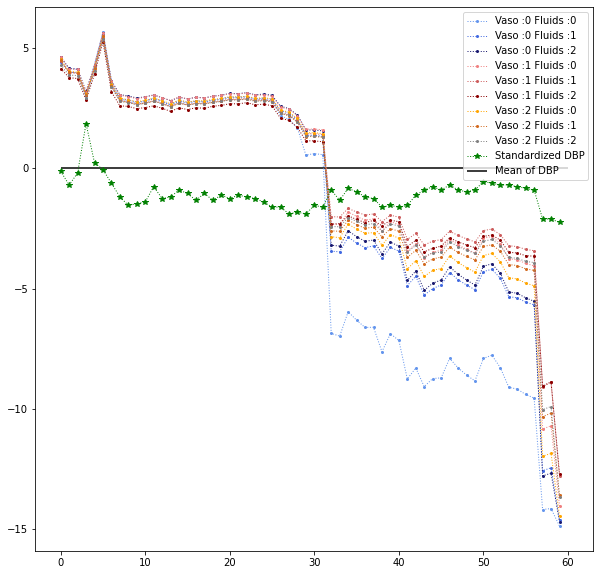

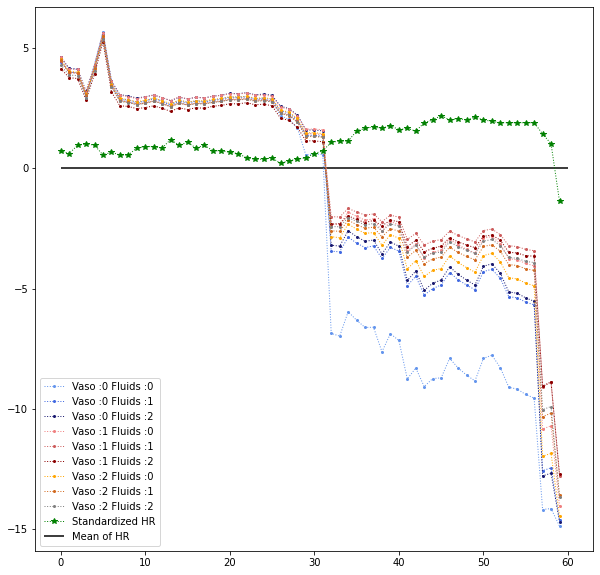

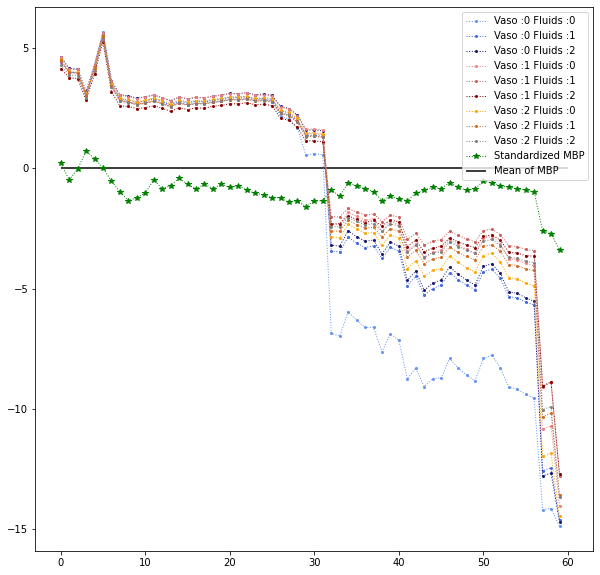

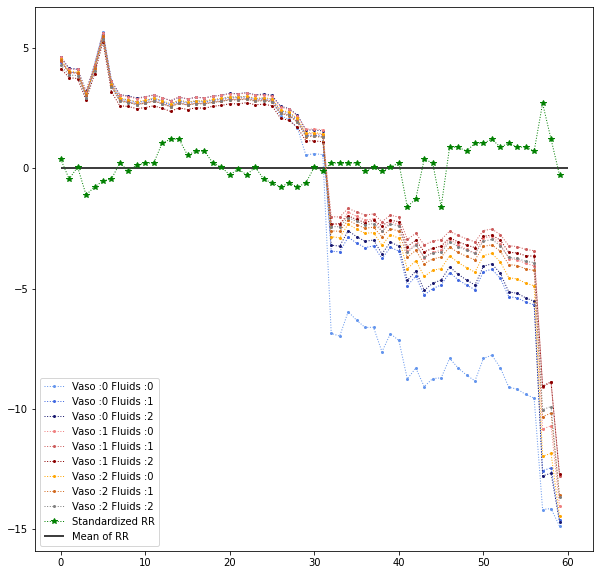

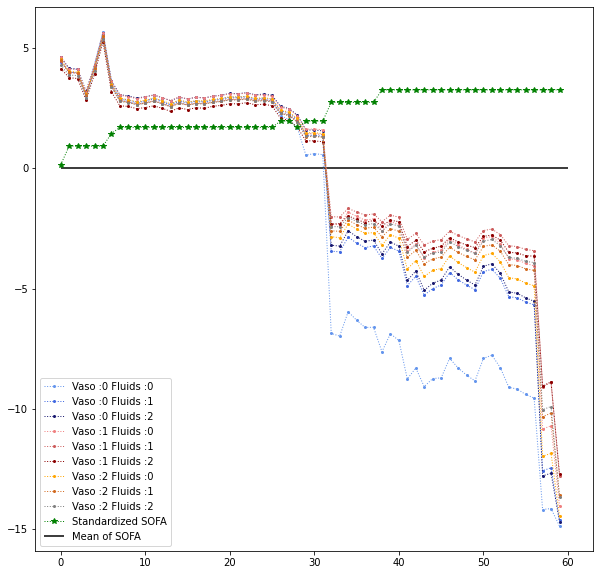

...

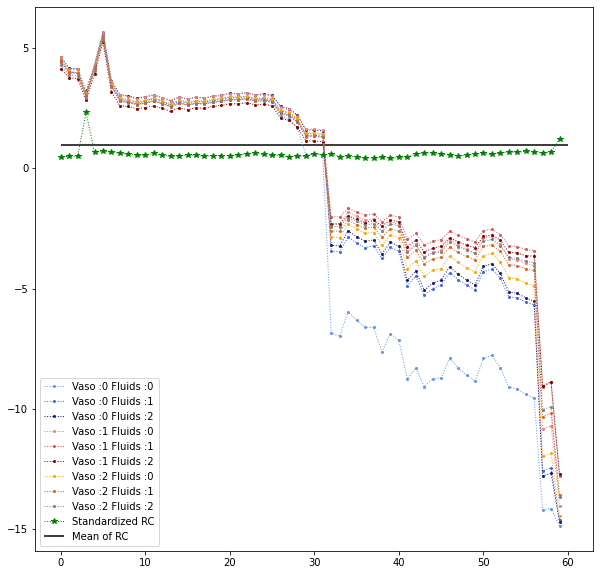

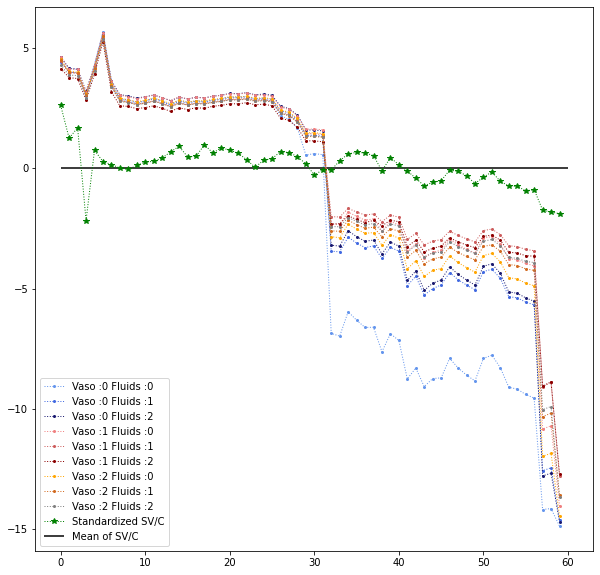

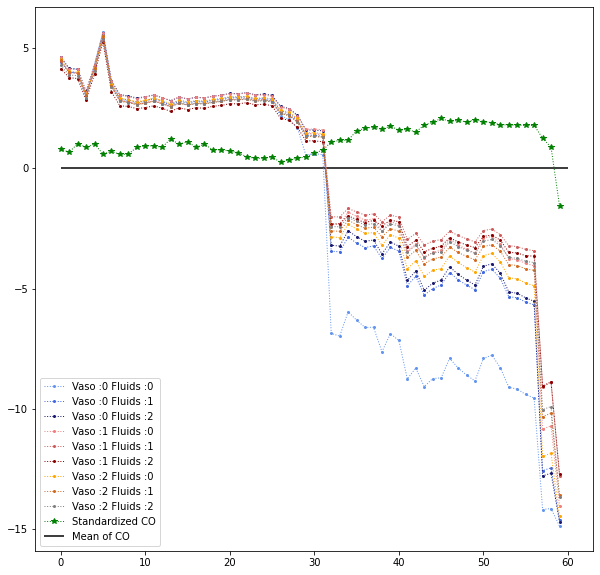

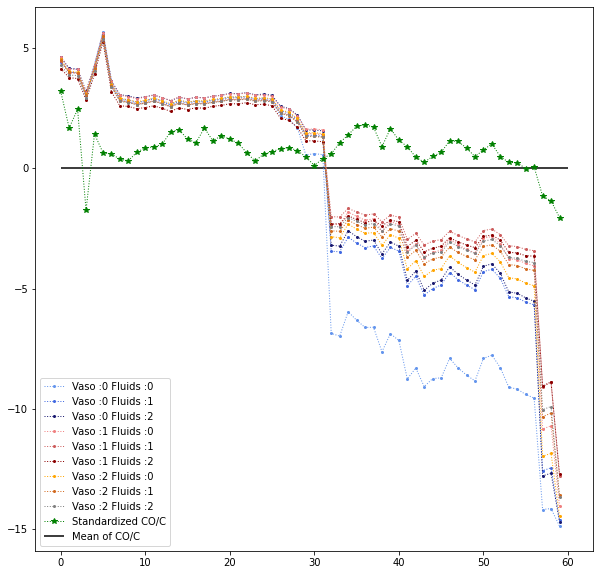

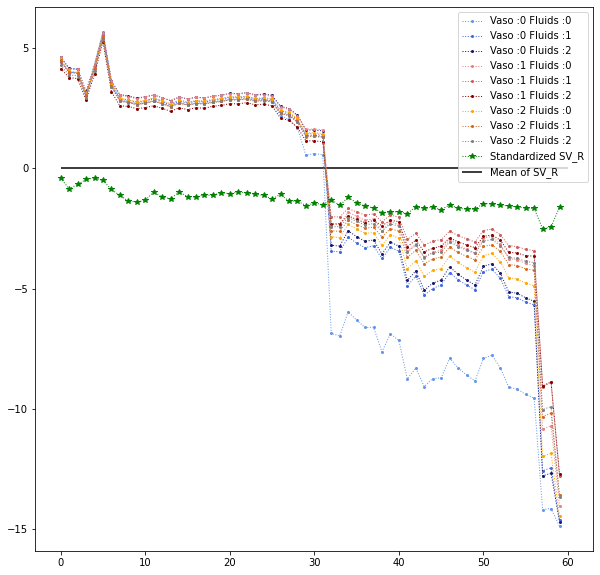

In [ ]:
pat=263969
for feat in 'DBP	HR	MBP	RR	SOFA SpO2 SBP R C SV RC SV/C CO	CO/C SV_R'.split():
  plot_feature_exp_values(pat,feat=[feat],size=(10,10))

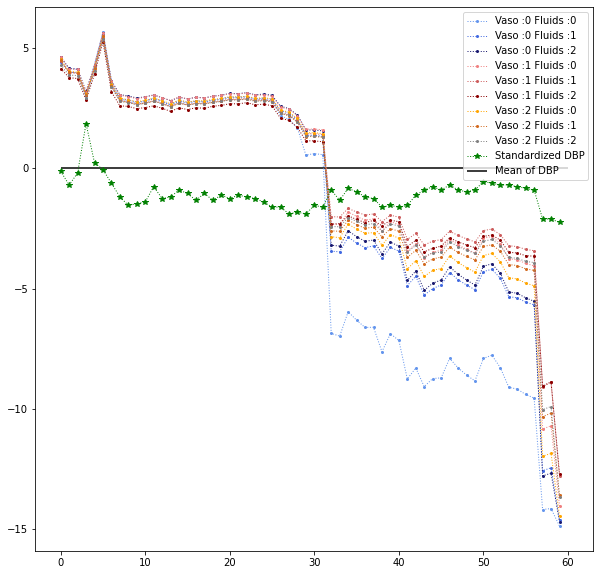

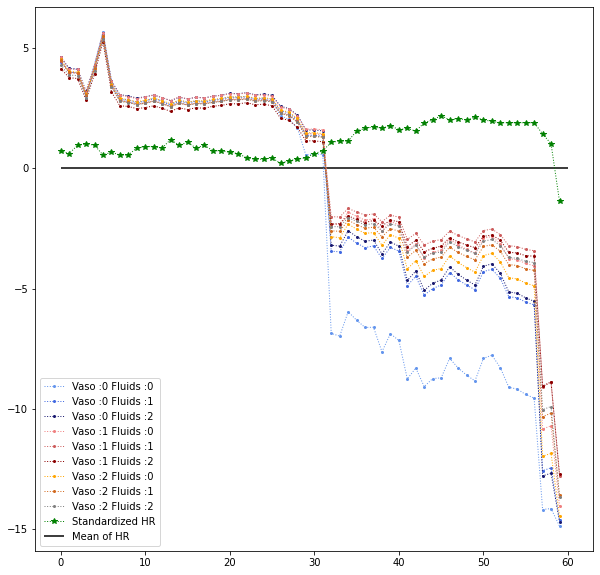

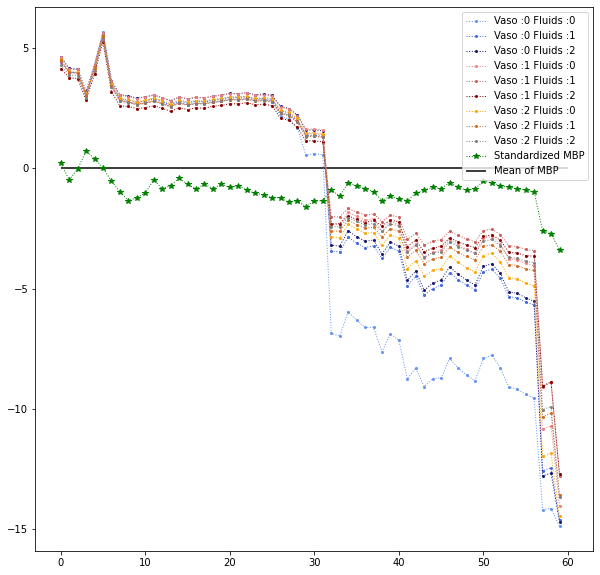

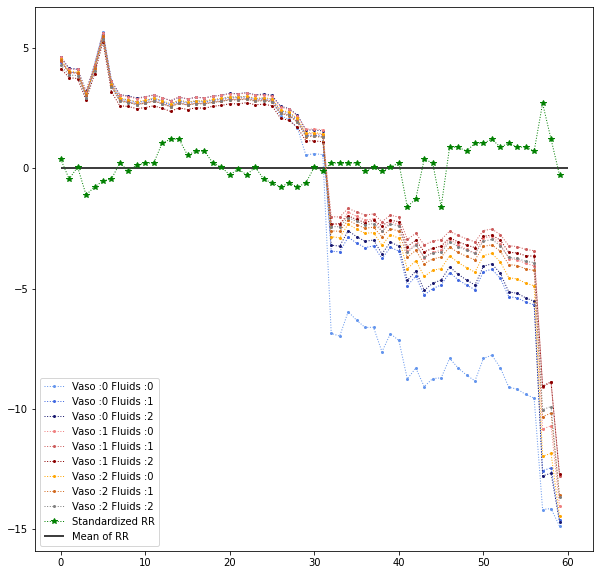

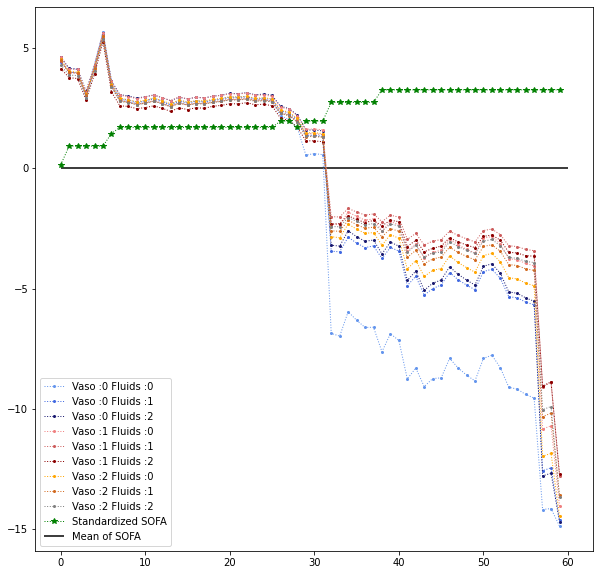

...

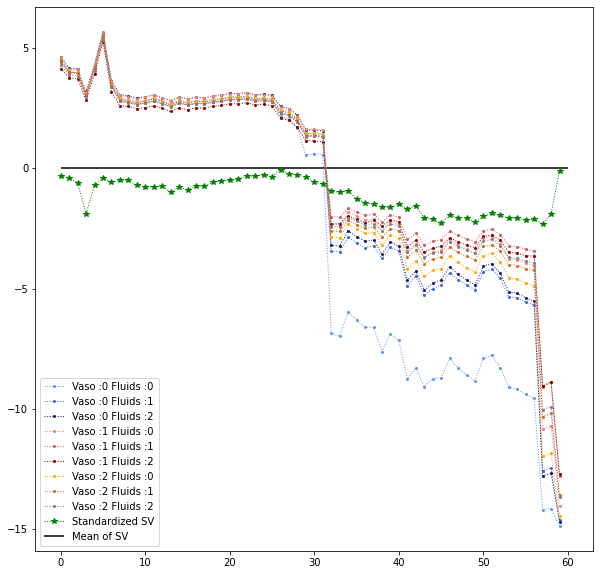

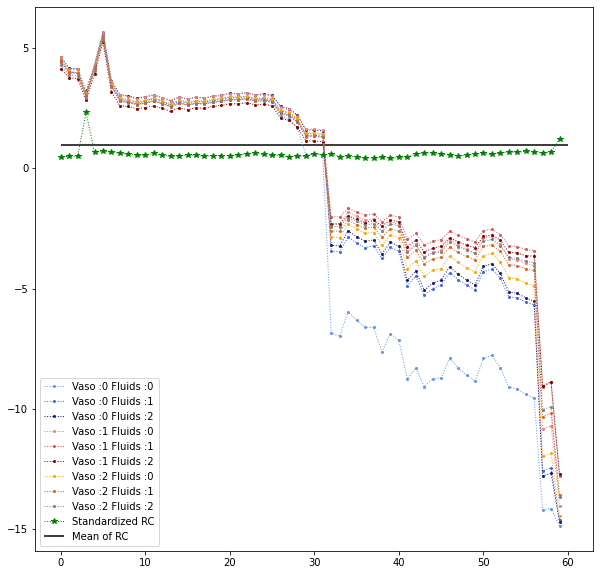

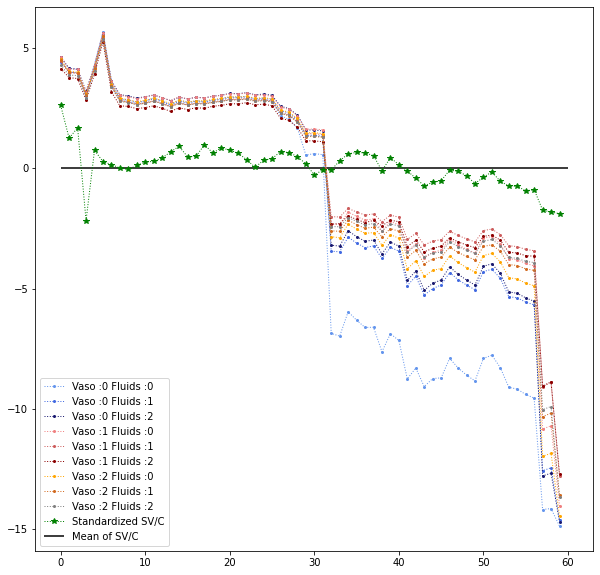

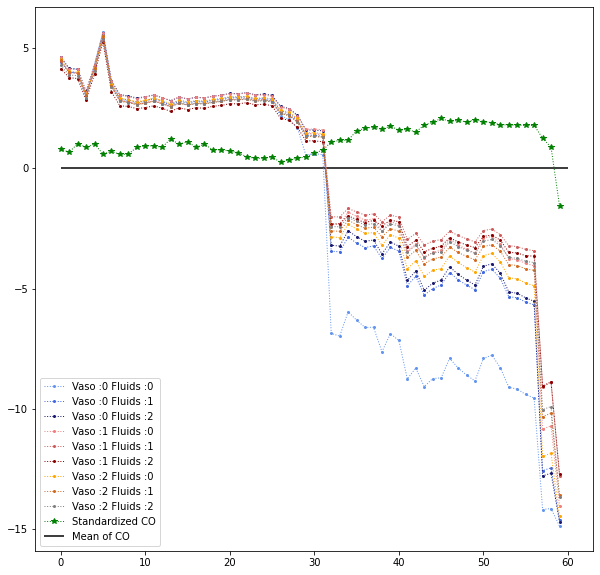

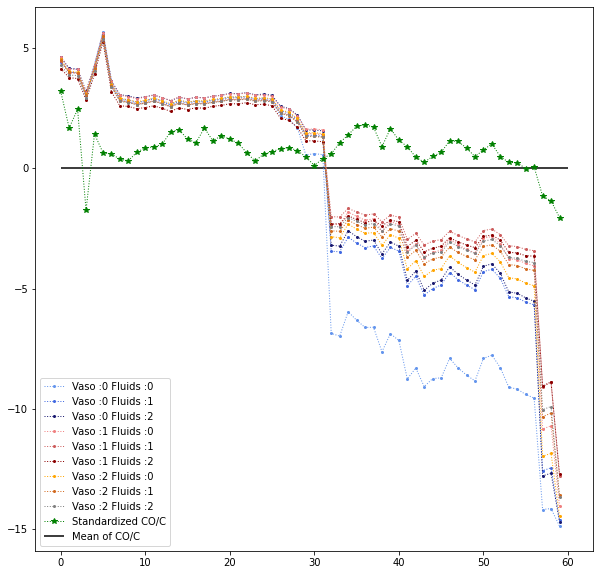

In [ ]:
pat=263969
for feat in 'DBP	HR	MBP	RR	SOFA SpO2 SBP R C SV RC SV/C CO	CO/C'.split():
  plot_feature_exp_values(pat,feat=[feat],size=(10,10))


Multiple Features in the same plot

In [ ]:
'HR RR SOFA SpO2 SBP  RC CO/C'.split()

['HR', 'RR', 'SOFA', 'SpO2', 'SBP', 'RC', 'CO/C']

In [ ]:
pat=263969
feats='HR SBP CO/C'.split()
plot_feature_exp_values(pat,feat=feats,size=(20,20))

Dead = True


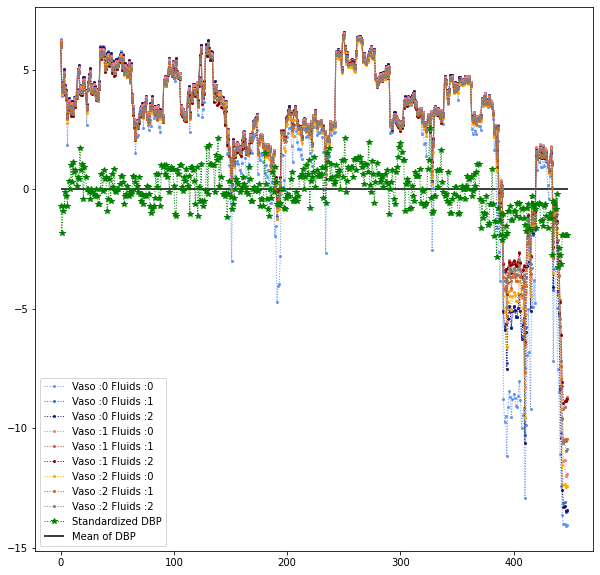

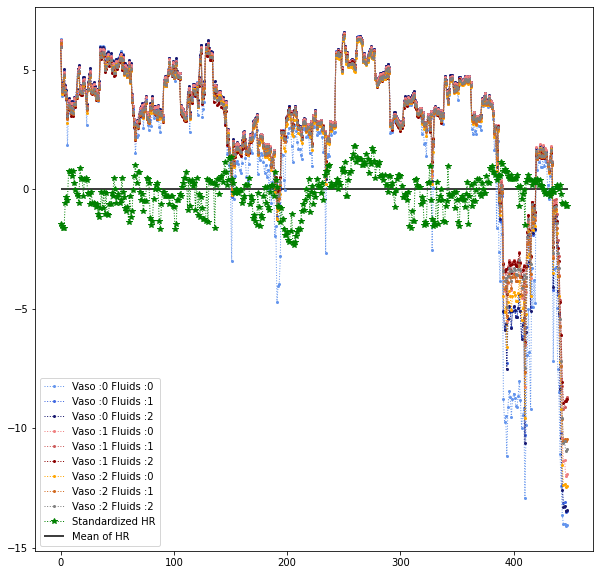

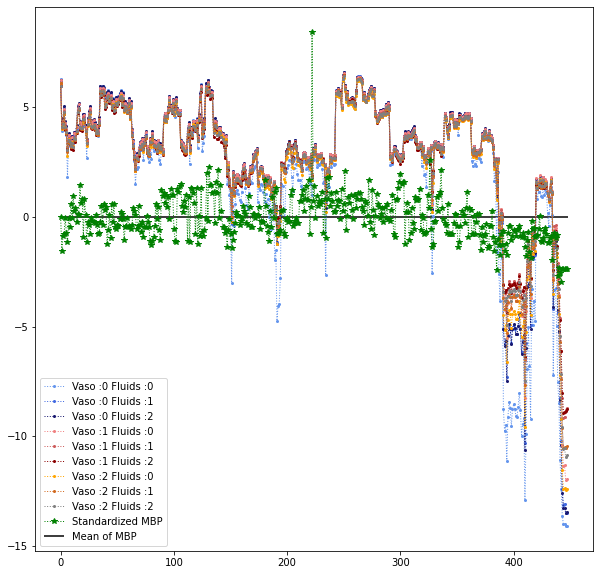

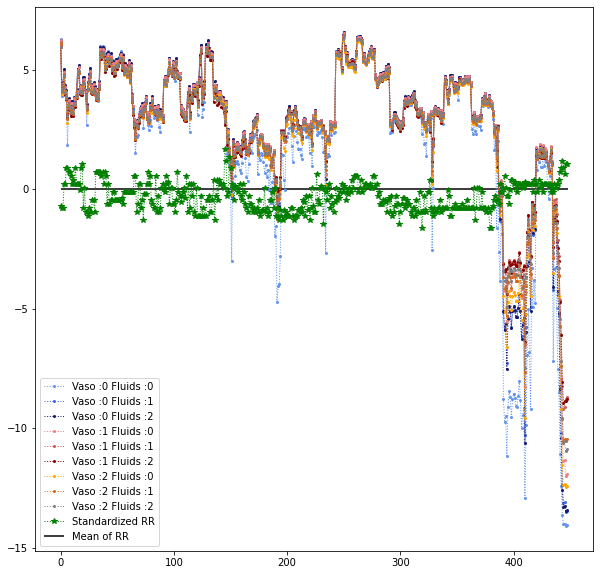

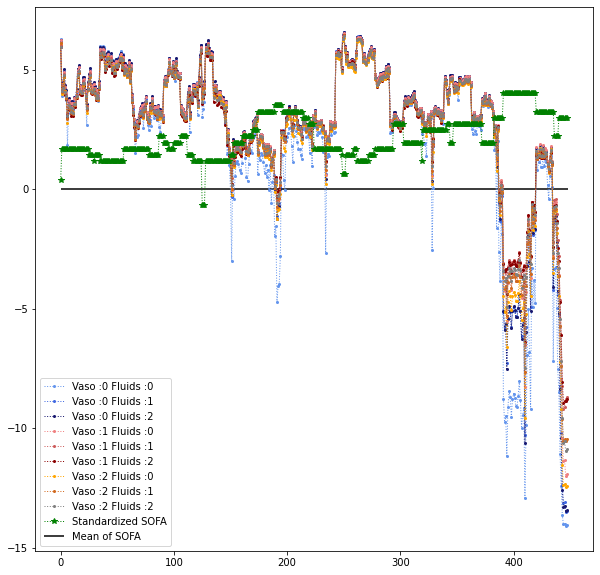

...

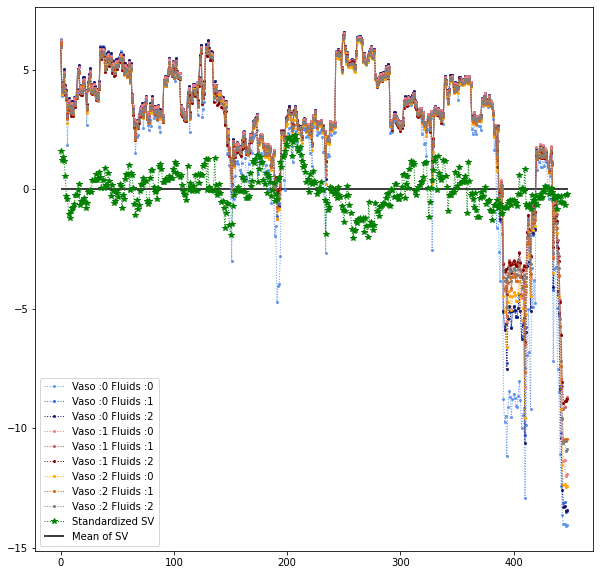

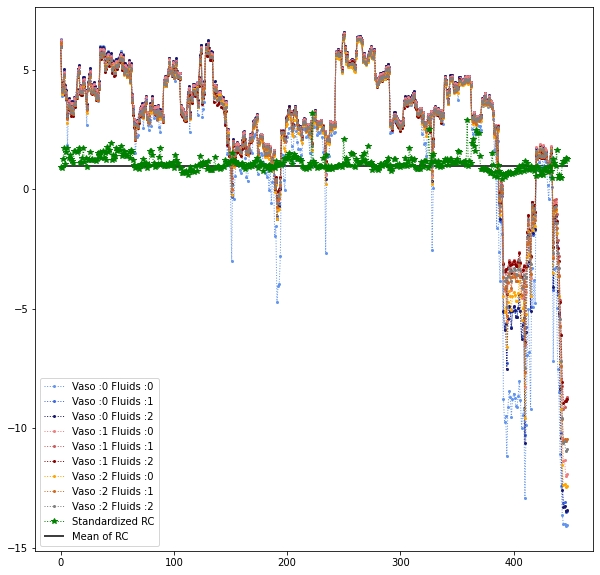

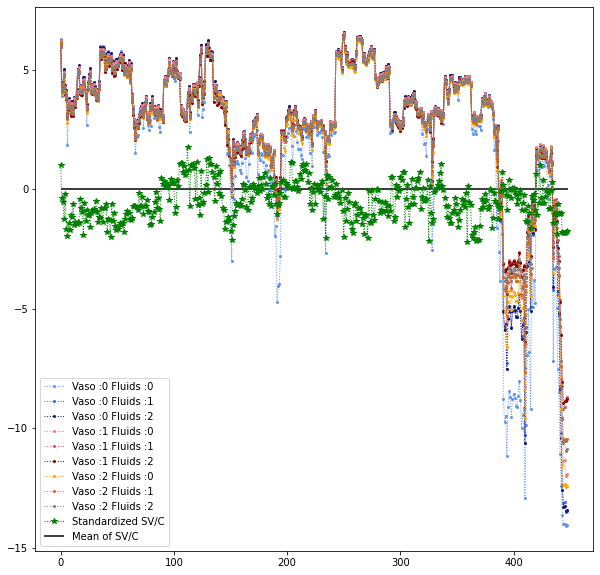

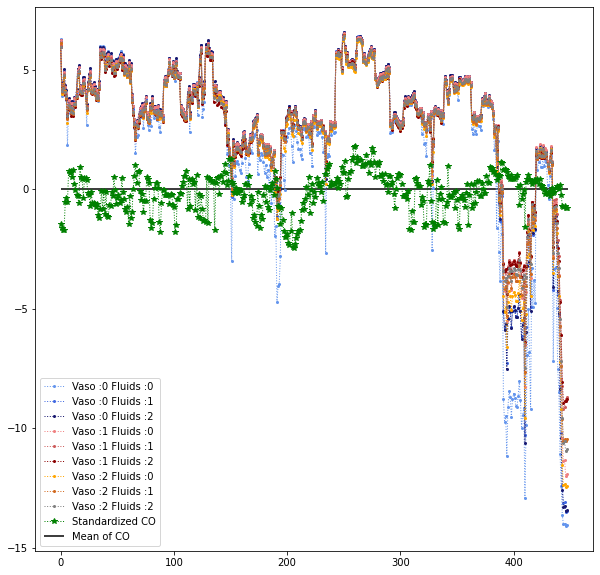

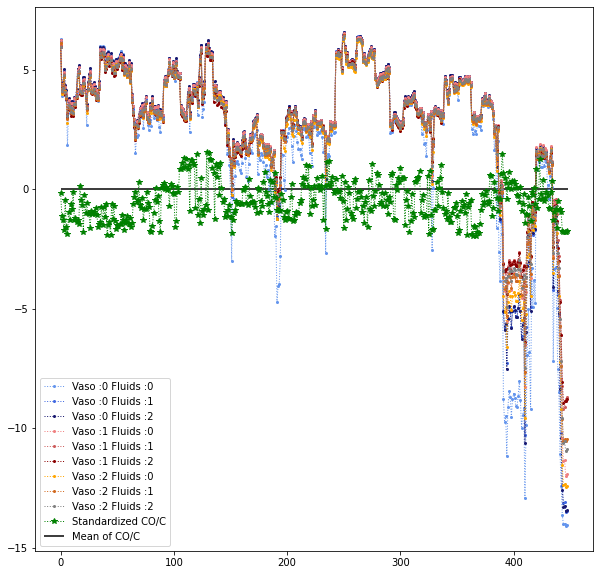

In [ ]:
pat=np.random.choice(df.Pat)
pat=252741
print('Dead =', df[df.Pat==pat].Rewards.iloc[-1]==-15)
for feat in 'DBP	HR	MBP	RR	SOFA SpO2 SBP R C SV RC SV/C CO	CO/C'.split():
  plot_feature_exp_values(pat,feat=[feat],size=(10,10))

In [ ]:
# dead_pats=list(df[df.Rewards==-15].Pat)
# pat=np.random.choice(dead_pats)
# print(pat)
# pat=np.random.choice(dead_pats)
for feat in 'DBP	HR	MBP	RR	SOFA SpO2 SBP R C SV RC CO_C'.split():
  plot_feature_treat(pat,feature=feat)

In [ ]:
# dead_pats=list(df[df.Rewards==-15].Pat)
# # pat=np.random.choice(dead_pats)
pat=243775
print('ICU ID :',pat)
for feat in 'DBP	HR	MBP	RR	SOFA SpO2 SBP R C SV'.split():
  plot_feature_treat(pat,feature=feat)

In [ ]:
# dead_pats=list(df[df.Rewards==-15].Pat)
# pats=np.random.choice(df.Pat,30)

# for pat in pats:
pat=243775
print('DEAD = ',df[df.Pat==pat].Rewards.iloc[-1]==-15)
plot_feature_CV(pat)

ICU ID : 235351
DEAD =  False


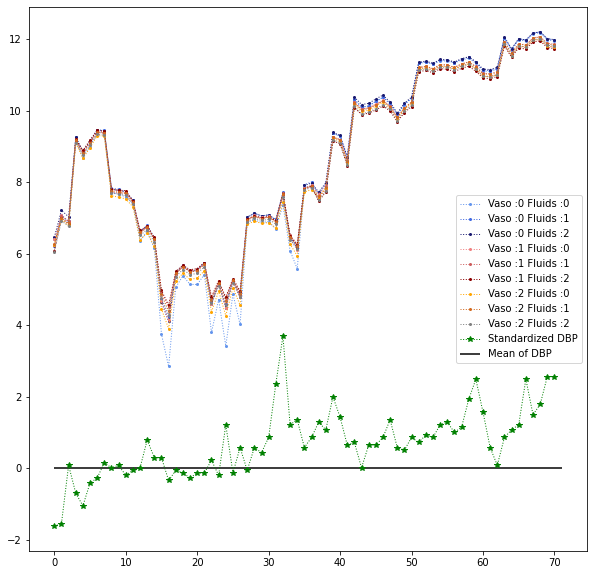

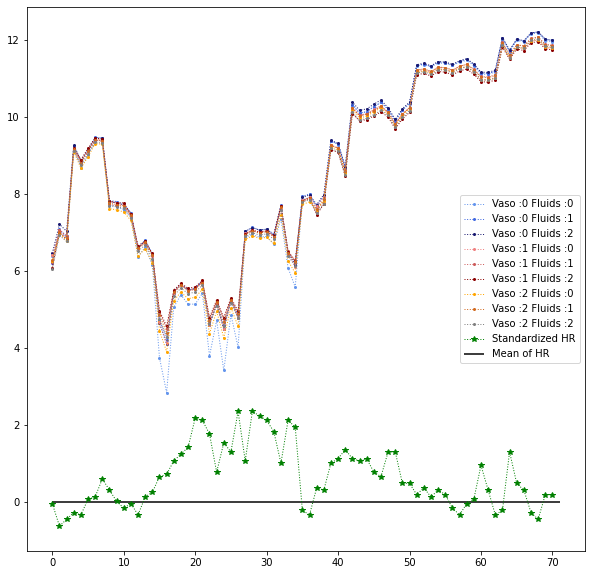

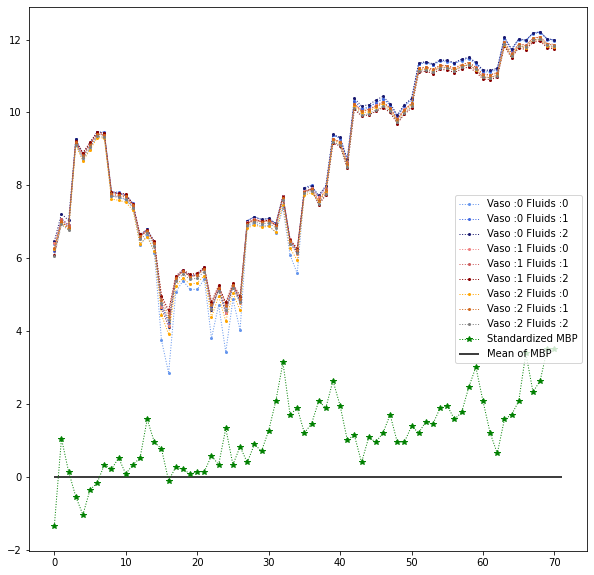

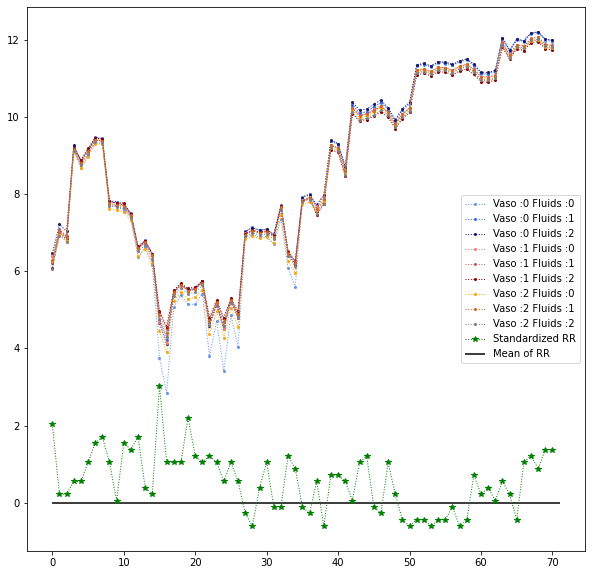

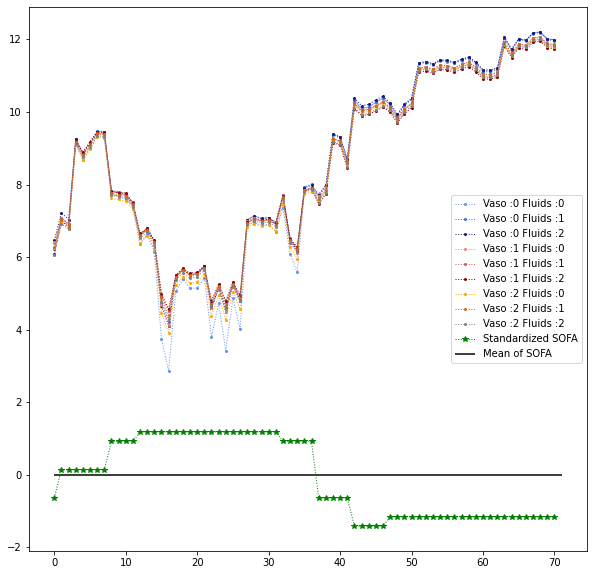

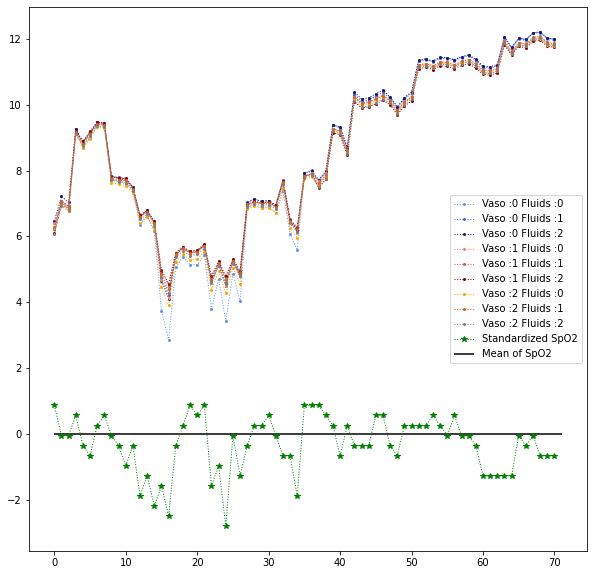

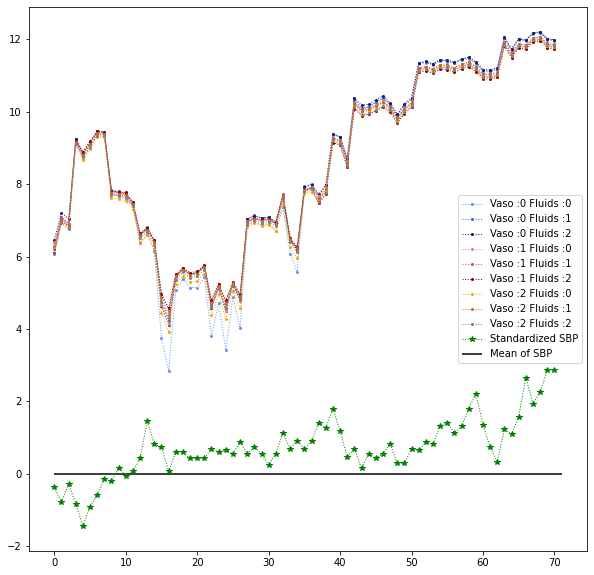

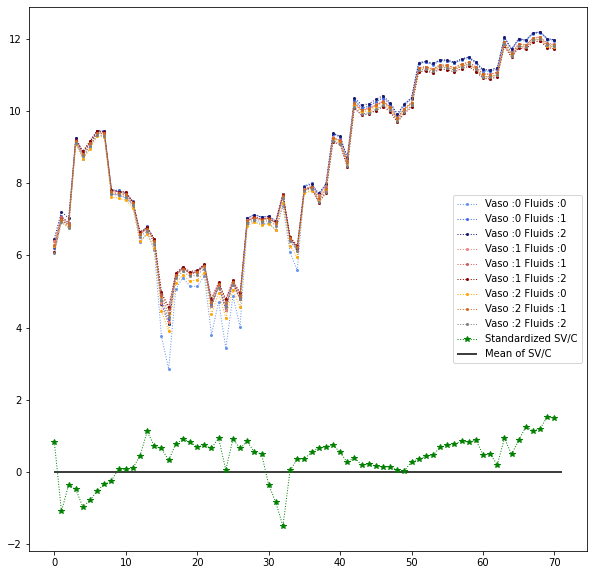

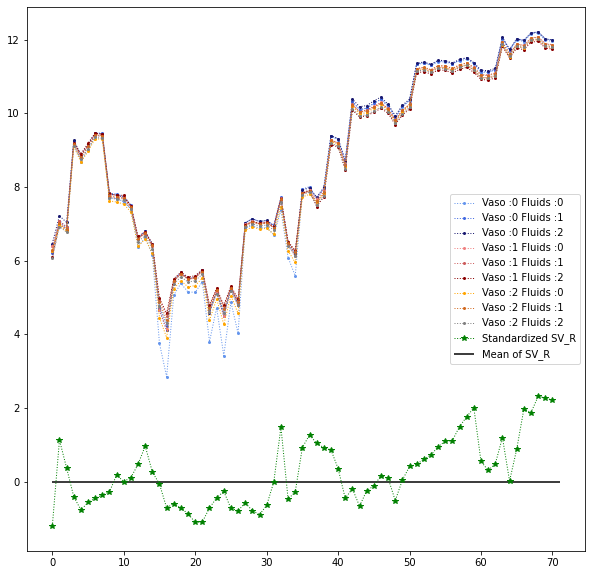

In [ ]:
#Survivor

# pat=np.random.choice(df.Pat)
print('ICU ID :',pat)
print('DEAD = ',df[df.Pat==pat].Rewards.iloc[-1]==-15)
for feat in 'DBP	HR	MBP	RR	SOFA SpO2 SBP SV/C SV_R'.split():
  plot_feature_exp_values(pat,feat=[feat],size=(10,10))


### Uncertainty

In [ ]:
kl=pd.read_csv('avergae_KLs.csv')

In [ ]:
kl=pd.read_csv('avergae_KLs.csv')
for i in range(9):
  
  df['kl_uncertainty_for_act_{}'.format(i)]=kl.iloc[:,i]

In [ ]:
df.sort_values(by='kl_uncertainty_for_act_0',ascending=False).head(50)

In [ ]:
df.head()

,DBP,HR,MBP,RR,SOFA,SpO2,SBP,TempC,cardio,cns,liver,renal,AG,BICARB,CREAT,CL,GLUC,HCT,HB,PLAT,K,Na,BUN,WBC,l_1,l_2,l_3,l_4,l_5,l_6,l_7,l_8,l_9,l_10,R,C,T,SV,age,M/F,weight,Vaso,Fluids,Rewards,Pat,SOFA_,SV_,SV_C,dist_Vaso,dist_Fluids,Vaso_cuts,Fluid_cuts,action,kl_uncertainty_for_act_0,kl_uncertainty_for_act_1,kl_uncertainty_for_act_2,kl_uncertainty_for_act_3,kl_uncertainty_for_act_4,kl_uncertainty_for_act_5,kl_uncertainty_for_act_6,kl_uncertainty_for_act_7
0,-0.975575,1.837045,-1.035731,0.880278,-1.673136,-0.958653,-0.556789,-0.723869,0.0,0.0,0.0,-0.868625,1.354087,-0.050696,0.226119,-0.273616,1.664569,0.619855,0.522458,0.450940,2.129651,0.279296,1.282761,-0.258103,-0.462474,-0.086368,0.014108,-0.474435,0.625043,0.389752,0.630310,0.071789,-0.213654,-0.500278,0.463221,1.030419,0.419510,-1.858045,1.047553,0.0,-0.334579,0.0,0.0,-0.250,262147,0.0,65.685165,0.129721,0,0.078759,0,0,0,0.138073,0.133364,0.132941,0.121833,0.143090,0.135532,0.104093,0.078759
1,-1.329863,1.428464,-1.285052,0.383965,-1.153666,-0.653502,-0.556789,-0.723869,1.0,0.0,0.0,-0.203927,1.354087,-0.050696,0.226119,-0.273616,1.664569,0.619855,0.522458,0.450940,2.129651,0.279296,1.282761,-0.258103,-0.462474,-0.086368,0.014108,-0.474435,0.625043,0.389752,0.630310,0.071789,-0.213654,-0.500278,0.461611,0.946364,0.446352,-1.324097,1.047553,0.0,-0.334579,0.0,0.0,-0.375,262147,2.0,66.568794,0.485759,0,0.107538,0,0,0,0.152918,0.159419,0.155522,0.136692,0.151703,0.142129,0.121128,0.107538
2,-1.117290,1.253358,-1.035731,-0.277787,-0.374462,0.261953,-0.156264,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.509343,0.863491,0.458074,-1.098627,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,5.0,66.941925,0.873511,0,0.101959,0,0,0,0.126858,0.132036,0.128167,0.113287,0.122830,0.115240,0.106603,0.101959
3,-1.329863,0.552933,-1.160392,-0.112349,-0.374462,-0.348350,-0.156264,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.554594,0.871751,0.518681,-0.403291,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,5.0,68.092636,0.905114,0,0.123083,0,0,0,0.143337,0.148115,0.145666,0.133475,0.141518,0.134463,0.126753,0.123083
4,-0.975575,0.494564,-0.848740,-0.112349,-0.374462,-1.263805,0.110754,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.609946,0.854549,0.534089,-0.295163,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,5.0,68.271576,1.001294,0,0.126077,0,0,0,0.143190,0.147734,0.145441,0.134840,0.142826,0.137033,0.128764,0.126077


In [ ]:
pats=np.random.choice(df.Pat,30)
pats=[242153]
for pat in pats:
  print('DEAD = ',df[df.Pat==pat].Rewards.iloc[-1]==-15)
  
  plt.figure(figsize=(10,10))
  pat_df=df[df.Pat==pat]

  legends=['Vaso :' +str(i)+' Fluids :'+ str(j) for i in range(3) for j in range(3)]
  colors=['cornflowerblue','royalblue','midnightblue','lightcoral','indianred','darkred','orange','chocolate','purple']
  

  for k in range(9):
    treat=pat_df['kl_uncertainty_for_act_{}'.format(k)]
    plt.plot(np.arange(treat.shape[0]),treat,color=colors[k],linestyle='dotted',linewidth=0.05,marker=".",markersize=5,label=legends[k])
  
  plt.legend()  
  plt.show()
 
    
  
  


In [ ]:
df.head()

,DBP,HR,MBP,RR,SOFA,SpO2,SBP,TempC,cardio,cns,liver,renal,AG,BICARB,CREAT,CL,GLUC,HCT,HB,PLAT,K,Na,BUN,WBC,l_1,l_2,l_3,l_4,l_5,l_6,l_7,l_8,l_9,l_10,R,C,T,SV,age,M/F,weight,Vaso,Fluids,Rewards,Pat,SOFA_,SV_,SV_C,dist_Vaso,dist_Fluids,Vaso_cuts,Fluid_cuts,action,kl_uncertainty_for_act_0,kl_uncertainty_for_act_1,kl_uncertainty_for_act_2,kl_uncertainty_for_act_3,kl_uncertainty_for_act_4,kl_uncertainty_for_act_5,kl_uncertainty_for_act_6,kl_uncertainty_for_act_7
0,-0.975575,1.837045,-1.035731,0.880278,-1.673136,-0.958653,-0.556789,-0.723869,0.0,0.0,0.0,-0.868625,1.354087,-0.050696,0.226119,-0.273616,1.664569,0.619855,0.522458,0.450940,2.129651,0.279296,1.282761,-0.258103,-0.462474,-0.086368,0.014108,-0.474435,0.625043,0.389752,0.630310,0.071789,-0.213654,-0.500278,0.463221,1.030419,0.419510,-1.858045,1.047553,0.0,-0.334579,0.0,0.0,-0.250,262147,0.0,65.685165,0.129721,0,0.078759,0,0,0,0.138073,0.133364,0.132941,0.121833,0.143090,0.135532,0.104093,0.078759
1,-1.329863,1.428464,-1.285052,0.383965,-1.153666,-0.653502,-0.556789,-0.723869,1.0,0.0,0.0,-0.203927,1.354087,-0.050696,0.226119,-0.273616,1.664569,0.619855,0.522458,0.450940,2.129651,0.279296,1.282761,-0.258103,-0.462474,-0.086368,0.014108,-0.474435,0.625043,0.389752,0.630310,0.071789,-0.213654,-0.500278,0.461611,0.946364,0.446352,-1.324097,1.047553,0.0,-0.334579,0.0,0.0,-0.375,262147,2.0,66.568794,0.485759,0,0.107538,0,0,0,0.152918,0.159419,0.155522,0.136692,0.151703,0.142129,0.121128,0.107538
2,-1.117290,1.253358,-1.035731,-0.277787,-0.374462,0.261953,-0.156264,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.509343,0.863491,0.458074,-1.098627,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,5.0,66.941925,0.873511,0,0.101959,0,0,0,0.126858,0.132036,0.128167,0.113287,0.122830,0.115240,0.106603,0.101959
3,-1.329863,0.552933,-1.160392,-0.112349,-0.374462,-0.348350,-0.156264,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.554594,0.871751,0.518681,-0.403291,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,5.0,68.092636,0.905114,0,0.123083,0,0,0,0.143337,0.148115,0.145666,0.133475,0.141518,0.134463,0.126753,0.123083
4,-0.975575,0.494564,-0.848740,-0.112349,-0.374462,-1.263805,0.110754,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.609946,0.854549,0.534089,-0.295163,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,5.0,68.271576,1.001294,0,0.126077,0,0,0,0.143190,0.147734,0.145441,0.134840,0.142826,0.137033,0.128764,0.126077


In [ ]:
df.describe()

## Polar plots and Uncertainty

### Helper Functions

In [ ]:
import plotly.express as px
import plotly.graph_objects as go
def plot_polar_plots(pat,save=False,df=df,times=[0,-12,-5]):

    pat_df=df[df.Pat==pat]
    state=torch.Tensor(pat_df.iloc[:,:41].values)
    exps=model.get_exp_vals(state).squeeze(-1).cpu().detach().numpy()

    actions = ['Vaso :' +str(i)+' Fluids :'+ str(j) for i in range(3) for j in range(3)]


  
    fig = go.Figure()
    names=['Admission']+['{} hours from death'.format(-time) for time in times[1:]]
    fig.add_trace(go.Scatterpolar(
        r=(exps[times[0],:]+18)/36,
        theta=actions,
        # fill='toself',
        name=names[0]
      
          ))
    
    fig.add_trace(go.Scatterpolar(
        r=(exps[times[1],:]+18)/36,
        theta=actions,
        # fill='toself',
        name=names[1]
      
          ))
    
    fig.add_trace(go.Scatterpolar(
        r=(exps[times[0],:]+18)/36,
        theta=actions,
        # fill='toself',
        name=names[2]
      
          ))
    
    
   
    fig.update_layout(
      polar=dict(
      radialaxis=dict(
      visible=True,
      range=[0, 1],
      showline=True
      
      )),
      showlegend=True

      )

    fig.show()
    if save==True:
      # fig.write_html("'radarplot_{}.html".format(pat))
      fig.write_image("radarplot_{}.jpg".format(pat))

In [ ]:
def plot_polar_KLs(pat,save=False,times=[0,-12,-5]):

    pat_df=df[df.Pat==pat]
    state=torch.Tensor(pat_df.iloc[:,:41].values)
    exps=model.get_exp_vals(state).squeeze(-1).cpu().detach().numpy()

    actions = ['Vaso :' +str(i)+' Fluids :'+ str(j) for i in range(3) for j in range(3)]

    fig = go.Figure()
    # fig.add_trace(go.Scatterpolar(
    #   r=(exps[0,:]+18)/36,
    #   theta=actions,
    #   fill='toself',
    #   name='Admission'
      
    # ))
    
    # fig.add_trace(go.Scatterpolar(
    #   r=(exps[-12,:]+18)/36,
    #   theta=actions,
    #   fill='toself',
    #   name='12 hours from death/Discharge'
      
    # ))

    # fig.add_trace(go.Scatterpolar(
    #   r=(exps[-5,:]+18)/36,
    #   theta=actions,
    #   fill='toself',
    #   name='5 hours from actual Death/Discharge'
    
    # ))
    cols=['Uncertainty_act_{}'.format(i) for i in range(9)]
    pat_kl=pat_df[cols]
    fig.add_trace(go.Scatterpolar(
      r=pat_kl.iloc[times[0],:],
      theta=actions,
      # fill='toself',
      name='Uncertainty Admission'
      
    ))

    
    fig.add_trace(go.Scatterpolar(
      r=pat_kl.iloc[times[1],:],
      theta=actions,
      # fill='toself',
      name='Uncertainty {} hrs from Death/Discharge'.format(times[1])
      
    ))

    
    fig.add_trace(go.Scatterpolar(
      r=pat_kl.iloc[times[2],:],
      theta=actions,
      # fill='toself',
      name='Uncertainty {} hrs from Death/Discharge'.format(times[2])
      
    ))



    fig.update_layout(
      polar=dict(
      radialaxis=dict(
      visible=True,
      # range=[0, 1],
      showline=True
      
      )),
      showlegend=True

    )

    fig.show()
    if save==True:
      # fig.write_html("'radarplot_{}.html".format(pat))
      fig.write_image("radarplot_{}.jpg".format(pat))

### Analysis

In [ ]:
def plot_polar_plots(pat,save=False,df=df,times=[0,-12,-5]):

    pat_df=df[df.Pat==pat]
    state=torch.Tensor(pat_df.iloc[:,:41].values)
    exps=model.get_exp_vals(state).squeeze(-1).cpu().detach().numpy()

    actions = ['Vaso :' +str(i)+' Fluids :'+ str(j) for i in range(3) for j in range(3)]


    
    fig = go.Figure()
    fig.add_trace(go.Scatterpolar(
        r=(exps[times[0],:]+18)/36,
        theta=actions,
        # fill='toself',
        name='Exp Values at Admission'
      
          ))
    
    fig.add_trace(go.Scatterpolar(
        r=(exps[times[1],:]+18)/36,
        theta=actions,
        # fill='toself',
        name='Exp Values {} hrs before death/discharge'.format(-times[1])
      
          ))
    
    fig.add_trace(go.Scatterpolar(
        r=(exps[times[2],:]+18)/36,
        theta=actions,
        # fill='toself',
        name='Exp Values {} hrs before death/discharge'.format(-times[2])
      
          ))
    
    
    
   
    fig.update_layout(
      polar=dict(
      radialaxis=dict(
      visible=True,
      range=[0, 1],
      showline=True
      
      )),
      showlegend=True

    )

    fig.show()
    if save==True:
      # fig.write_html("'radarplot_{}.html".format(pat))
      fig.write_image("radarplot_{}.jpg".format(pat))
      

In [ ]:
dead=df[df.Rewards==-15].Pat
pat=np.random.choice(dead)
print(pat)
plot_polar_plots(pat,save=False,times=[0,-30,-12])

206431


In [ ]:
pat=np.random.choice(df[df.Rewards==-15].Pat)
print(pat)
plot_feature_uncertainty(pat,feat=['SOFA','SBP','SV_R'])

233676


In [ ]:
dead=df[df.Rewards==-15].Pat
pat=np.random.choice(dead)
print(pat)
plot_polar_plots(pat,save=False)

246554


In [ ]:
pat_surv=df[df.Rewards==15].Pat
surv_pat=np.random.choice(pat_surv)
print(surv_pat)
plot_polar_plots(surv_pat,times=[0,-12,-5])


241922


In [ ]:
pat=252741
# pat=249546
print('ICUSTAY :ID',pat)
plot_polar_KLs(pat,save=False)


ICUSTAY :ID 252741


In [ ]:
dead=list(df[df.Rewards==-15].Pat)
_=np.random.choice(dead)

print('ICUSTAY :ID',_)
plot_polar_KLs(_,save=False)


ICUSTAY :ID 288942


In [ ]:
_=np.random.choice(df[df.Rewards==15].Pat)

plot_polar_KLs(_,save=False)

In [ ]:
pat=263969
pat_df=df[df.Pat==pat]
cols=['Uncertainty_act_{}'.format(i) for i in range(9)]
pat_kl=pat_df[cols]
for t in range(pat_df.shape[0]):
    actions = ['Vaso :' +str(i)+' Fluids :'+ str(j) for i in range(3) for j in range(3)]
    cols=['Uncertainty_act_{}'.format(i) for i in range(9)]
    pat_kl=pat_df[cols]
    fig = go.Figure()
    fig.add_trace(go.Scatterpolar(
      r=pat_kl.iloc[t,:],
      theta=actions,
      # fill='toself',
      name='Uncertainty at time {}'.format(t)
      
      ))
    fig.update_layout(
      polar=dict(
      radialaxis=dict(
      visible=True,
      # range=[0,2.0],
      showline=True
      
      )),
      showlegend=True,
      title=t


        



    )
    fig.show()


In [ ]:
pat_df.shape

### Plotting a whole trajectory of a patient

In [ ]:
pat=np.random.choice(dead)
pat_df=df[df.Pat==pat]
print('ICUID :', pat,' Length ',pat_df.shape[0])
cols=['Uncertainty_act_{}'.format(i) for i in range(9)]
pat_kl=pat_df[cols]
for t in range(pat_df.shape[0]):
    actions = ['Vaso :' +str(i)+' Fluids :'+ str(j) for i in range(3) for j in range(3)]
    pat_kl=pat_df.iloc[:,-9:]
    fig = go.Figure()
    fig.add_trace(go.Scatterpolar(
      r=pat_kl.iloc[t,:],
      theta=actions,
      # fill='toself',
      name='Uncertainty at time {}'.format(t)
      
      ))
    fig.update_layout(
      polar=dict(
      radialaxis=dict(
      visible=True,
      # range=[0,2.0],
      showline=True
      
      )),
      showlegend=True,
      title=t


        



    )
    fig.show()


In [ ]:
ls

## Validation

In [14]:
val_df=pd.read_csv('../../../../RL_val.csv')
val_df=val_df.iloc[:,1:]
print('Loaded')
val_df.columns=df.columns[:45]
val_df['SV_']=val_df.SV
val_df['SV_C']=(val_df.SV_/val_df.C)
val_df['CO']=(val_df.SV*val_df.HR)
val_df['CO_C']=val_df.CO/val_df.C

val_df['SV_C']=(val_df['SV_C']-val_df['SV_C'].mean())/(val_df['SV_C'].std())
val_df['CO']=(val_df['CO']-val_df['CO'].mean())/(val_df['CO'].std())
val_df['CO_C']=(val_df['CO_C']-val_df['CO_C'].mean())/(val_df['CO_C'].std())
val_df['RC']=val_df.R*val_df.C
val_df['CO/C']=val_df['CO_C']

Loaded


In [15]:
val_df.head()

,DBP,HR,MBP,RR,SOFA,SpO2,SBP,TempC,cardio,cns,liver,renal,AG,BICARB,CREAT,CL,GLUC,HCT,HB,PLAT,K,Na,BUN,WBC,l_1,l_2,l_3,l_4,l_5,l_6,l_7,l_8,l_9,l_10,R,C,T,SV,age,M/F,weight,Vaso,Fluids,Rewards,Pat,SV_,SV_C,CO,CO_C,RC,CO/C
0,57.0,90.0,69.0,14.0,5.0,100.0,98.0,37.799999,1.0,4.0,0.0,0.0,-0.708817,-0.838437,-0.659904,1.777689,-0.618447,-0.213809,-0.107123,-0.724009,-0.344044,0.857453,-0.620443,0.128732,0.197923,0.105806,-0.255739,0.534732,0.483859,-0.758225,-0.380859,-0.082806,-0.122179,0.080003,0.666731,1.667938,0.603311,67.941063,47.0,0.0,87.2,0.0,500.0,-0.025,200009,67.941063,-1.057214,0.345959,-0.793851,1.112066,-0.793851
1,56.0,91.0,68.0,19.0,5.0,100.0,96.0,37.900002,1.0,4.0,0.0,0.0,-0.708817,-0.838437,-0.659904,1.777689,-0.618447,-0.213809,-0.107123,-0.724009,-0.344044,0.857453,-0.620443,0.128732,0.197923,0.105806,-0.255739,0.534732,0.483859,-0.758225,-0.380859,-0.082806,-0.122179,0.080003,0.664922,1.695960,0.606689,67.864685,47.0,0.0,87.2,0.0,375.0,-0.025,200009,67.864685,-1.096711,0.407288,-0.808635,1.127682,-0.808635
2,55.0,93.0,67.0,17.0,5.0,100.0,86.0,38.000000,1.0,4.0,0.0,0.0,-0.708817,-0.838437,-0.659904,1.777689,-0.618447,-0.213809,-0.107123,-0.724009,-0.344044,0.857453,-0.620443,0.128732,0.197923,0.105806,-0.255739,0.534732,0.483859,-0.758225,-0.380859,-0.082806,-0.122179,0.080003,0.632300,2.194721,0.605790,67.283615,47.0,0.0,87.2,0.0,500.0,-0.025,200009,67.283615,-1.611468,0.489431,-1.283396,1.387723,-1.283396
3,58.0,105.0,71.0,18.0,5.0,100.0,93.0,38.099998,1.0,4.0,0.0,0.0,-0.708817,-0.838437,-0.659904,1.777689,-0.618447,-0.213809,-0.107123,-0.724009,-0.344044,0.857453,-0.620443,0.128732,0.197923,0.105806,-0.255739,0.534732,0.483859,-0.758225,-0.380859,-0.082806,-0.122179,0.080003,0.611805,1.945178,0.534462,66.394684,47.0,0.0,87.2,0.0,500.0,-0.025,200009,66.394684,-1.420276,1.207458,-0.843147,1.190070,-0.843147
4,57.0,96.0,69.0,16.0,5.0,100.0,99.0,37.900002,1.0,4.0,0.0,0.0,-0.708817,-0.838437,-0.659904,1.777689,-0.618447,-0.213809,-0.107123,-0.724009,-0.344044,0.857453,-0.620443,0.128732,0.197923,0.105806,-0.255739,0.534732,0.483859,-0.758225,-0.380859,-0.082806,-0.122179,0.080003,0.648374,1.579956,0.576718,67.517929,47.0,0.0,87.2,0.0,875.0,-0.025,200009,67.517929,-0.947179,0.715021,-0.531664,1.024402,-0.531664


In [16]:
val_df.iloc[:,cols]=(val_df.iloc[:,cols]-means[cols])/stds[cols]
print('Normalized')

Normalized


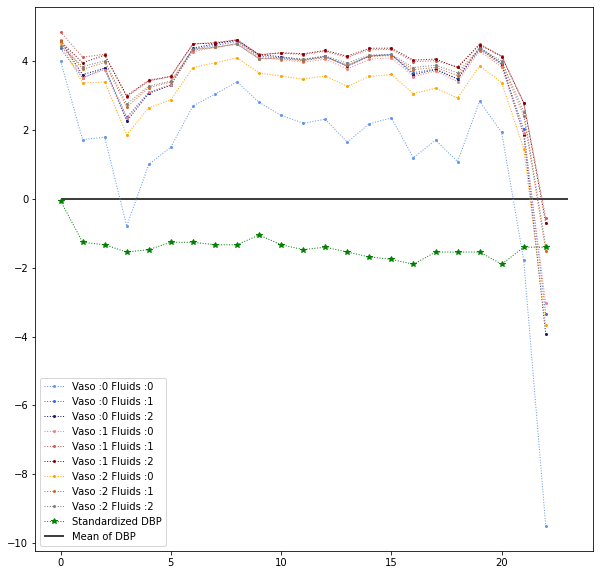

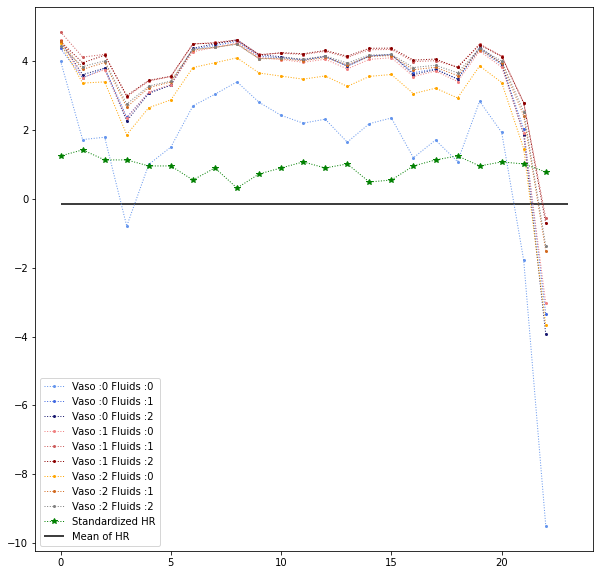

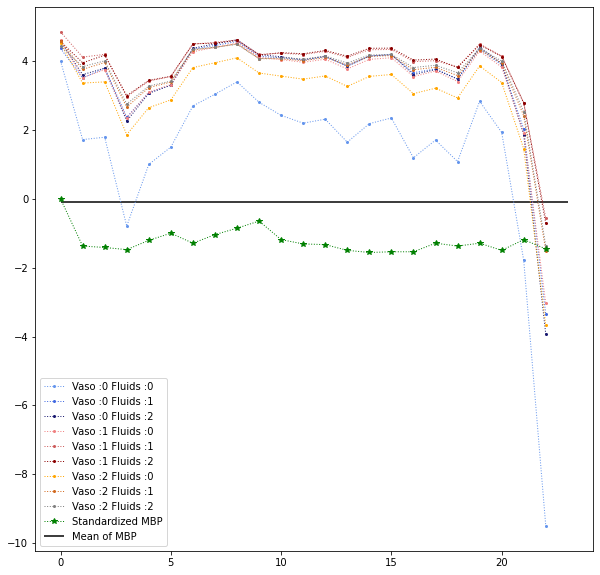

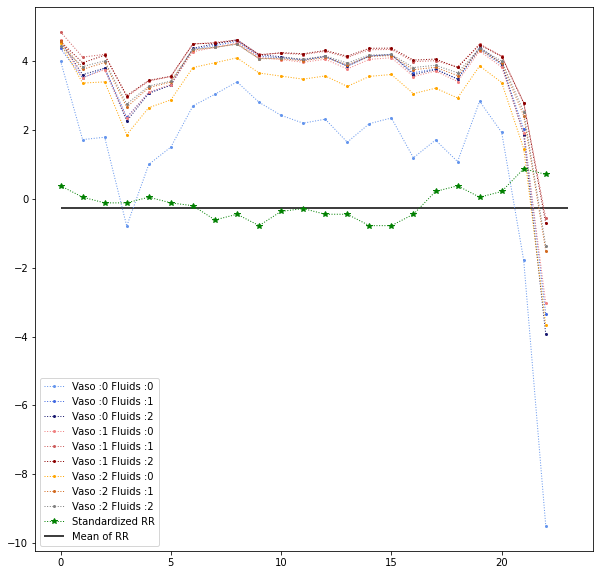

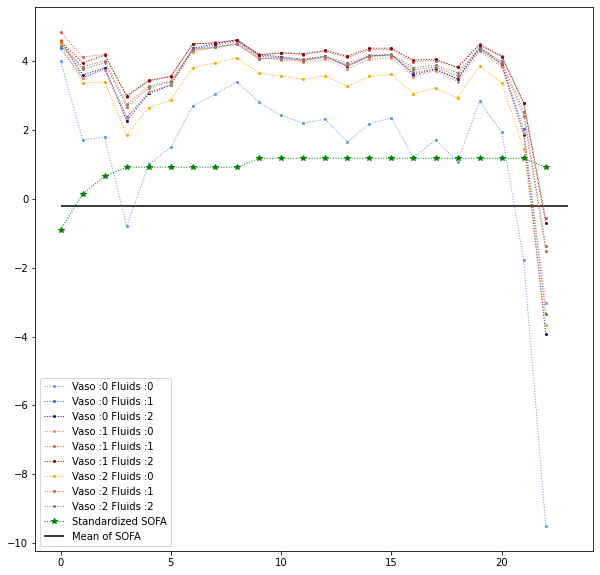

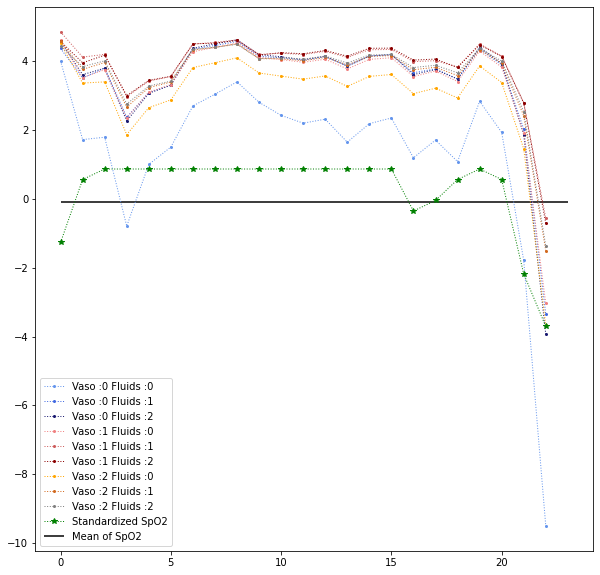

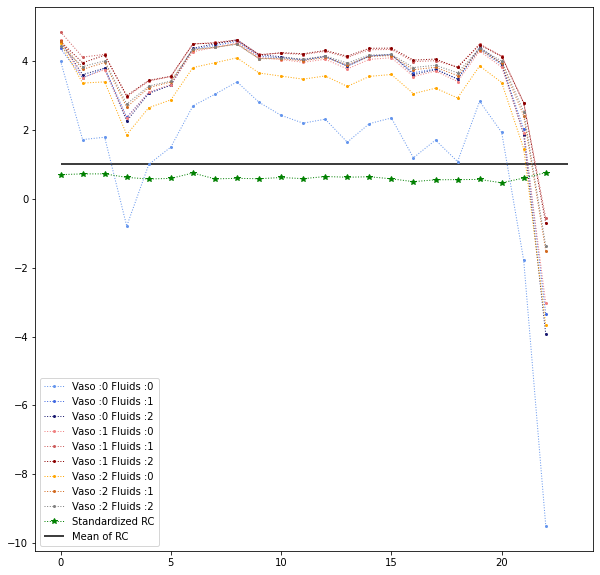

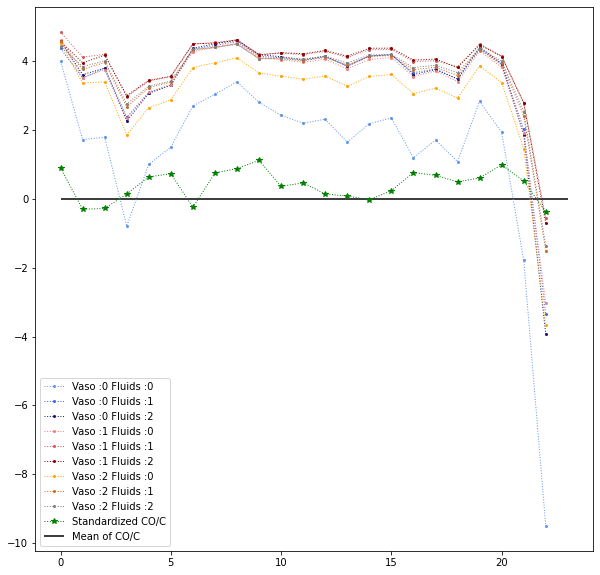

In [ ]:
val_df['RC']=val_df.R*val_df.C
val_df['CO/C']=val_df['CO_C']

pat=np.random.choice(val_df[val_df.Rewards==-15].Pat)
for feat in 'DBP	HR	MBP	RR	SOFA SpO2 RC CO/C'.split():
  plot_feature_exp_values(pat,feat=[feat],df=val_df,size=(10,10))


In [ ]:

for pat in (val_df[val_df.Rewards==-15].Pat):
  if val_df[val_df.Pat==pat].shape[0]<13:
    continue
  plot_polar_plots(pat,df=val_df)

# Ensemble Dist DQN

In [17]:
filenames=['dist_bootstrap_{}.pt'.format(i) for i in range(1,30)]

In [ ]:
ls ../../imitation

Imitation_10.pt  Imitation_3.pt  Imitation_6.pt  Imitation_9.pt
Imitation_11.pt  Imitation_4.pt  Imitation_7.pt  Imitation.pt
Imitation_2.pt   Imitation_5.pt  Imitation_8.pt


In [18]:
I_filename='../../imitation/Imitation_6.pt'

In [19]:

class FC_I(nn.Module):
	def __init__(self, state_dim, num_actions,q_layers=4,i_layers=4):
		super(FC_I, self).__init__()
		# self.q1 = nn.Linear(state_dim, 512)
		# self.q2 = nn.Linear(512, 512)
		# self.q3 = nn.Linear(512, num_actions)
    
		self.i1,self.hiddens = nn.Linear(state_dim,512),nn.ModuleList([nn.Sequential(nn.Linear(512,512),nn.ReLU()) for _ in range(3)])
    
		self.i2 = nn.Linear(512, 256)
	
		self.i3 = nn.Linear(256, num_actions)		


	def forward(self, state):
		# q = F.relu(self.q1(state))
		# q = F.relu(self.q2(q))

		i = F.relu(self.i1(state))
		for layer in self.hiddens:
			i=layer(i)
		i = F.relu(self.i2(i))
		i = F.relu(self.i3(i))
		return F.log_softmax(i, dim=1), i


In [20]:
filenames=['dist_bootstrap_{}.pt'.format(i) for i in range(1,30)]
class ensemble_distDQN(object):
  def __init__(self,model,filenames,I_filename):
    self.models=[model]
    for k in range(len(filenames)):
      model_=dist_DQN(v_max=18,v_min=-18)
      load_model(model_,filenames[k])
      self.models.append(model_)
   
    self.I=FC_I(41,9)
    
    checkpoint=torch.load(I_filename)
    self.I.load_state_dict(checkpoint['state_dict'])  
    # self.weights=[1]+22*[0.4]+6*[0.65]
    self.weights=[1]*len(self.models)

  def get_ensemble_exp_values(self,state):
    exp_val=model.get_exp_vals(state).squeeze(-1)
    for j in range(1,len(self.models)):
      exp_val+=self.models[j].get_exp_vals(state).squeeze(-1)*self.weights[j]

    return exp_val/sum(self.weights)

  def set_weights(self,weights):
    self.weights=weights


  def get_ensemble_action(self,state,lam=False):
    exp_vals=self.get_ensemble_exp_values(state)
    if lam:
      assert lam>=0
      exp_vals+=-lam*self.get_uncertainty(state)
    a_star = torch.argmax(exp_vals, dim=1)
    return a_star

  def get_kl_loss(self,Q,logQ,logQ1):
    """
    Q should be the reference

    """
    kld=torch.sum(torch.mul(Q, logQ-logQ1),-1)
  
  
    return kld

  def get_uncertainty(self,state):
      Q,logQ=self.models[0].Q(state)
      kld=0    
      for i in range(1,len(self.models)):
          Q1,logQ1=self.models[i].Q(state)
          kld+=self.get_kl_loss(Q,logQ,logQ1)

      return kld/len(self.models)

  def uncertainty_aware_actions(self,state,beta1,beta2,lam):
     assert beta1>=0 and beta2>=0 and lam>=0
     exp_vals=self.models[0].get_exp_vals(state).squeeze(-1) #Batch_size*|A|
     exp_score=torch.exp(beta1*(exp_vals-exp_vals.max(dim=1)[0].view(-1,1)))

     behav_probs,_=self.I(state)
     behav_probs=behav_probs.exp()
     behav_score=torch.exp(beta2*(behav_probs-behav_probs.max(dim=1)[0].view(-1,1)))

     uncertainty_score=-lam*self.get_uncertainty(state)
     
     total_score=exp_score+behav_score+uncertainty_score
     action=total_score.max(dim=1)[1]

     return action, (exp_score,behav_score,uncertainty_score)



In [21]:
ensm=ensemble_distDQN(model=model,filenames=filenames,I_filename=I_filename)

In [28]:
import matplotlib.pyplot as plt
def plot_feature_ensemble_exp_values(pat,df=df,feat=None,size=(20,20)):
  
  legends=['Vaso :' +str(i)+' Fluids :'+ str(j) for i in range(3) for j in range(3)]
  colors=['cornflowerblue','royalblue','midnightblue','lightcoral','indianred','darkred','orange','chocolate','grey']  
             
    
  plt.figure(figsize=size)
  pat_df=df[df.Pat==pat]

  state=torch.FloatTensor(df[df.Pat==pat].iloc[:,:41].values).to(device)
  
  exps=ensm.get_ensemble_exp_values(state) #T*9

  for k in range(9):
     plt.plot(np.arange(state.shape[0]),exps[:,k].cpu().detach().numpy(),color=colors[k],linestyle='dotted',linewidth=1,label=legends[k],marker=".",markersize=4)

  if feat:
     plt.plot(np.arange(state.shape[0]),pat_df[feat].values,'g',linestyle=':',linewidth=1,marker='*',label='Standardized {}'.format(feat))
     plt.hlines(df[feat].mean(),0,(pat_df.shape[0]),'k',label='Mean of {}'.format(feat))

  
  
  plt.legend()
  plt.show()

In [29]:
pat=263969

In [ ]:
pat_df=df[df.Pat==pat]
state=torch.FloatTensor(df[df.Pat==pat].iloc[:,:41].values).to(device)

In [ ]:
plot_feature_ensemble_exp_values(pat,size=(10,10),feat='SBP')

In [ ]:

def plot_feature_ensm_treat(pat,df=df,feature='SBP',size=(10,10),lam=False):
  
  legends = ['Fluids for the Patient', 'Standardized {}'.format(feature),'Mean {}'.format(feature),'Vaso for the patient']
  acts=[(0,0),(0,1),(0,2),(1,0),(1,1),(1,2),(2,0),(2,1),(2,2)]          
  
  plt.figure(figsize=size)
  pat_df=df[df.Pat==pat]

  state=torch.FloatTensor(df[df.Pat==pat].iloc[:,:41].values).to(device)

  action=ensm.get_ensemble_action(state,lam=lam)
  fluids_pat=[acts[action[i]][1] for i in range(action.shape[0])]
  vaso_pat=[acts[action[i]][0] for i in range(action.shape[0])]

  plt.plot(np.arange(pat_df.shape[0]),fluids_pat,'royalblue',linestyle='dotted',linewidth=0.8,label=legends[0],marker=".",markersize=5)
  plt.plot(np.arange(pat_df.shape[0]),vaso_pat,'orange',linestyle='dotted',linewidth=0.8,label=legends[3],marker=".",markersize=5)
  
  plt.plot(np.arange(pat_df.shape[0]),pat_df[feature].values,'g',linestyle=':',linewidth=1,marker='*',label=legends[1])
  title='Lambda :'+ str(lam)
  plt.title(title)
  
   
  plt.hlines(df[feature].mean(),0,(pat_df.shape[0]),'k',label=legends[2])
  
  plt.legend()

In [ ]:
pat=np.random.choice(df[df.Rewards==15].Pat)
print(pat)
for feat in 'DBP	HR	MBP	RR	SOFA SpO2 SBP R C SV RC SV/C CO	CO/C SV_R'.split():
    plot_feature_ensm_treat(pat,feature=[feat])
# ensm.set_weights([1]+[0]*(len(ensm.models)-1))
# plot_feature_ensm_treat(pat)
# ensm.set_weights([1]+[1]*(len(ensm.models)-1))

In [ ]:
pat=np.random.choice(dead)
plot_feature_ensm_treat(pat)
ensm.set_weights([1]+[0]*(len(ensm.models)-1))
plot_feature_ensm_treat(pat)
ensm.set_weights([1]+[1]*(len(ensm.models)-1))



In [ ]:
# pat=np.random.choice(df[df.Rewards==15].Pat)
plot_feature_ensm_treat(pat)
ensm.set_weights([1]+[0]*(len(ensm.models)-1))
plot_feature_ensm_treat(pat)
ensm.set_weights([1]+[1]*(len(ensm.models)-1))

In [32]:
import plotly.graph_objects as go

actions = ['Vaso :' +str(i)+' Fluids :'+ str(j) for i in range(3) for j in range(3)]
def plot_feature_uncertainty(pat,df=df,feat=None,size=(20,20),marker_only=False):
             
    

  pat_df=df[df.Pat==pat]
  state=torch.FloatTensor(df[df.Pat==pat].iloc[:,:41].values).to(device)
  
  exps=model.get_exp_vals(state).squeeze(-1).detach().cpu().numpy()  #T*9
  cols=['Uncertainty_act_{}'.format(i) for i in range(9)]
  uncertains=pat_df[cols].values
  
  fig = go.Figure()
  for k in range(9):
     label='Expected Values for '+ actions[k]
    
    #  label="Expected Values for Action : "+actions[k]
     fig.add_trace(go.Scatter(x=np.arange(pat_df.shape[0]), y=exps[:,k],
                    mode='lines+markers', marker=dict(size=uncertains[:,k]*10),
                    name=label))
     
  cols=['peru','darkslategray','darkcyan']
        
        
  
  if feat:
    for i,feature in enumerate(feat):
      style='lines+markers'
      if marker_only:
        style='markers'
      if feature=='SOFA':
        style='lines+markers'
      fig.add_trace(go.Scatter(x=np.arange(pat_df.shape[0]),y=pat_df[feature].values,
                    mode=style,
                    name=feature,marker=dict(color=cols[i],size=4,symbol='x')))


  fig.show()
 
  
  


In [ ]:
plot_polar_plots(pat,times=[0,-10,-3])

In [ ]:
df.head()

,DBP,HR,MBP,RR,SOFA,SpO2,SBP,TempC,cardio,cns,liver,renal,AG,BICARB,CREAT,CL,GLUC,HCT,HB,PLAT,K,Na,BUN,WBC,l_1,l_2,l_3,l_4,l_5,l_6,l_7,l_8,l_9,l_10,R,C,T,SV,age,M/F,weight,Vaso,Fluids,Rewards,Pat,SOFA_,SV_,SV_C,CO,CO_C,(CO)R,SV/C,CO/C,RC,SV_R,(SV)R,Vaso_cuts,Fluid_cuts,action,Uncertainty_act_0,Uncertainty_act_1,Uncertainty_act_2,Uncertainty_act_3,Uncertainty_act_4,Uncertainty_act_5,Uncertainty_act_6,Uncertainty_act_7,Uncertainty_act_8
0,-0.975575,1.837045,-1.035731,0.880278,-1.673136,-0.958653,-0.556789,-0.723869,0.0,0.0,0.0,-0.868625,1.354087,-0.050696,0.226119,-0.273616,1.664569,0.619855,0.522458,0.450940,2.129651,0.279296,1.282761,-0.258103,-0.462474,-0.086368,0.014108,-0.474435,0.625043,0.389752,0.630310,0.071789,-0.213654,-0.500278,0.463221,1.030419,0.419510,-1.855119,1.047553,0.0,-0.334579,0.0,0.0,-0.250,262147,0.0,65.685165,0.128407,1.775704,1.294811,-1.146763,0.128407,1.294811,0.477312,30.426780,-1.694610,0,0,0,0.130724,0.135124,0.123371,0.140597,0.123786,0.124978,0.132911,0.140032,0.131786
1,-1.329863,1.428464,-1.285052,0.383965,-1.153666,-0.653502,-0.556789,-0.723869,1.0,0.0,0.0,-0.203927,1.354087,-0.050696,0.226119,-0.273616,1.664569,0.619855,0.522458,0.450940,2.129651,0.279296,1.282761,-0.258103,-0.462474,-0.086368,0.014108,-0.474435,0.625043,0.389752,0.630310,0.071789,-0.213654,-0.500278,0.461611,0.946364,0.446352,-1.321893,1.047553,0.0,-0.334579,0.0,0.0,-0.375,262147,2.0,66.568794,0.484040,1.424462,1.457859,-1.337315,0.484040,1.457859,0.436852,30.728890,-1.674477,0,0,0,0.060853,0.063705,0.061028,0.072561,0.065455,0.066339,0.066464,0.070868,0.064441
2,-1.117290,1.253358,-1.035731,-0.277787,-0.374462,0.261953,-0.156264,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.509343,0.863491,0.458074,-1.096728,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,5.0,66.941925,0.871353,1.269669,1.779949,-1.049022,0.871353,1.779949,0.439813,34.096379,-1.450068,0,0,0,0.075947,0.080192,0.077299,0.083193,0.078754,0.083813,0.080179,0.084492,0.079455
3,-1.329863,0.552933,-1.160392,-0.112349,-0.374462,-0.348350,-0.156264,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.554594,0.871751,0.518681,-0.402332,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,5.0,68.092636,0.902920,0.596891,1.281431,-1.109643,0.902920,1.281431,0.483468,37.763738,-1.205676,0,0,0,0.075032,0.079676,0.077619,0.082652,0.077981,0.082275,0.079727,0.083640,0.078458
4,-0.975575,0.494564,-0.848740,-0.112349,-0.374462,-1.263805,0.110754,-0.723869,1.0,0.0,0.0,1.790167,2.643402,-1.035373,0.226119,0.199762,0.582360,0.286389,-0.054658,0.476552,3.521104,0.664734,1.489631,0.661645,-0.696658,0.058330,-0.158973,-0.117952,0.737430,0.266839,0.538169,0.202432,-0.357259,-0.794549,0.609946,0.854549,0.534089,-0.294351,1.047553,0.0,-0.334579,0.0,0.0,-0.025,262147,5.0,68.271576,0.998990,0.547276,1.333417,-0.758523,0.998990,1.333417,0.521229,41.641984,-0.947229,0,0,0,0.078151,0.082766,0.080651,0.084582,0.080031,0.084484,0.082106,0.085886,0.080657


In [ ]:
pat=263969
plot_feature_uncertainty(pat,feat=['SBP','(CO)R','SOFA','R'])

In [ ]:
# pat=np.random.choice(df[df.Rewards==15].Pat)
pat=281690

print(pat)
plot_feature_uncertainty(pat,feat=["R_"])

281690


In [ ]:
# pat=np.random.choice(df[df.Rewards==-15].Pat)
# print(pat)
pat=236634
plot_feature_uncertainty(pat,feat=['SBP','(CO)R','R_'])

In [ ]:
# pat=np.random.choice(df[df.Rewards==15].Pat)
# print(pat)
pat=253145

plot_feature_uncertainty(pat,feat=['SBP','(CO)R','R_'],marker_only=True)

In [ ]:
state=torch.Tensor(df[df.Pat==pat].iloc[:,:41].values)
model.get_exp_vals(state).max(dim=1)[1]

In [ ]:
load_model(model,'dist_2.pt')
# pat=np.random.choice(df[df.Rewards==-15].Pat)
# print(pat)

plot_feature_uncertainty(pat,feat=['SBP'])

In [ ]:
# load_model(model,'dist_2.pt')
pat=np.random.choice(df[df.Rewards==-15].Pat)
print(pat)

plot_feature_uncertainty(pat,feat=['SBP','SV_R','SOFA'])

280310


In [ ]:
pat=281690
pat_df=df[df.Pat==pat]
state=torch.Tensor(pat_df.iloc[:,:41].values)
exps=model.get_exp_vals(state).squeeze(-1).cpu().detach().numpy()

actions = ['Vaso :' +str(i)+' Fluids :'+ str(j) for i in range(3) for j in range(3)]

fig = go.Figure()
fig.add_trace(go.Scatterpolar(
      r=(exps[0,:]+18)/36,
      theta=actions,
      # fill='toself',
      name='Admission'
      
    ))
    
fig.add_trace(go.Scatterpolar(
      r=(exps[14,:]+18)/36,
      theta=actions,
      # fill='toself',
      name='14 hours from admissions'
      
    ))

fig.add_trace(go.Scatterpolar(
      r=(exps[40,:]+18)/36,
      theta=actions,
      # fill='toself',
      name='40 hours from actual admissions'
    
    ))

fig.add_trace(go.Scatterpolar(
      r=(exps[-2,:]+18)/36,
      theta=actions,
      # fill='toself',
      name='2 hours from actual discharge'
    
    ))

fig.update_layout(
      polar=dict(
      radialaxis=dict(
      visible=True,
      range=[0, 1],
      showline=True
      
      )),
      showlegend=True

    )

fig.show()
   

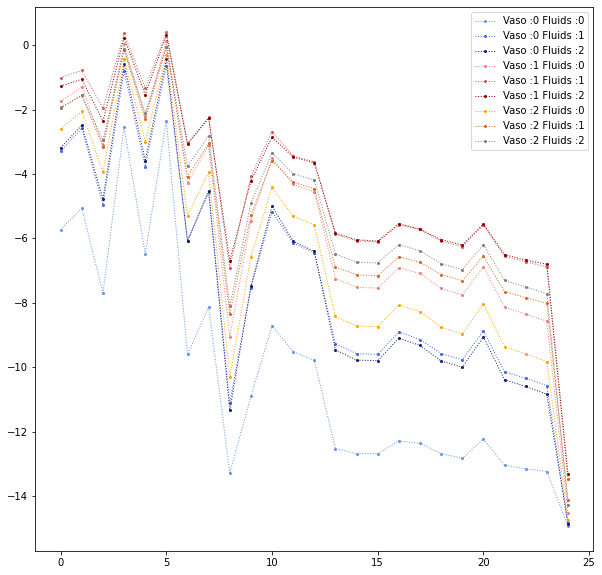

In [ ]:
pat=np.random.choice(val_df[val_df.Rewards==-15].Pat)
plot_feature_exp_values(pat,df=val_df)

In [ ]:
pat=np.random.choice(val_df[val_df.Rewards==15].Pat)
pat_df=val_df[val_df.Pat==pat]
state=torch.Tensor(pat_df.iloc[:,:41].values)
exps=model.get_exp_vals(state).squeeze(-1).cpu().detach().numpy()

actions = ['Vaso :' +str(i)+' Fluids :'+ str(j) for i in range(3) for j in range(3)]

fig = go.Figure()
fig.add_trace(go.Scatterpolar(
      r=(exps[0,:]+18)/36,
      theta=actions,
      # fill='toself',
      name='Admission'
      
    ))
    
# fig.add_trace(go.Scatterpolar(
#       r=(exps[14,:]+18)/36,
#       theta=actions,
#       # fill='toself',
#       name='14 hours from admissions'
      
#     ))

fig.add_trace(go.Scatterpolar(
      r=(exps[-12,:]+18)/36,
      theta=actions,
      # fill='toself',
      name='12 hours from actual admissions'
    
    ))

fig.add_trace(go.Scatterpolar(
      r=(exps[-5,:]+18)/36,
      theta=actions,
      # fill='toself',
      name='5 hours from actual discharge'
    
    ))

fig.update_layout(
      polar=dict(
      radialaxis=dict(
      visible=True,
      range=[0, 1],
      showline=True
      
      )),
      showlegend=True

    )

fig.show()
   

## Action Analysis

In [33]:
def plot_feature_treat(pat,df=df,feature='SBP',size=(10,5),beta1=0.5,beta2=0.01,lam=0.5,save_title=False):
  
  legends = ['Fluids for the Patient', 'Standardized {}'.format(feature),'Mean {}'.format(feature),'Vaso for the patient']
  acts=[(0,0),(0,1),(0,2),(1,0),(1,1),(1,2),(2,0),(2,1),(2,2)]          
  
  plt.figure(figsize=size)
  pat_df=df[df.Pat==pat]
  clinician_action=pat_df.action.values

  state=torch.FloatTensor(df[df.Pat==pat].iloc[:,:41].values).to(device)
  # fluids_clinician=[acts[clinician_action[i]][1] for i in range(clinician_action.shape[0])]
  # vaso_clinician=[acts[clinician_action[i]][0] for i in range(clinician_action.shape[0])]

  action,_=ensm.uncertainty_aware_actions(state,beta1,beta2,lam)
  fluids_pat=[acts[action[i]][1] for i in range(action.shape[0])]
  vaso_pat=[acts[action[i]][0] for i in range(action.shape[0])]

  plt.plot(np.arange(pat_df.shape[0]),fluids_pat,'k',linestyle='dotted',linewidth=0.8,label=legends[0],marker=".",markersize=5)
  plt.plot(np.arange(pat_df.shape[0]),vaso_pat,'r',linestyle='dotted',linewidth=0.8,label=legends[3],marker=".",markersize=5)

  # plt.plot(np.arange(pat_df.shape[0]),fluids_clinician,'green',linestyle='dotted',linewidth=0.8,label='Actual Clinician Fluids',marker=".",markersize=5)
  # plt.plot(np.arange(pat_df.shape[0]),vaso_clinician,'black',linestyle='dotted',linewidth=0.8,label='Actual Clinician Vaso',marker=".",markersize=5)
  
  # plt.plot(np.arange(pat_df.shape[0]),pat_df[feature].values,'g',linestyle=':',linewidth=1,marker='*',label=legends[1])
  title='Beta 1 :'+ str(beta1)+' Beta 2 :'+ str(beta2)+' lambda :'+str(lam)
  plt.title(title)
  plt.legend()
   
  # plt.hlines(df[feature].mean(),0,(pat_df.shape[0]),'k',label=legends[2])
  if save_title:
    filename='{}.jpg'.format(save_title)
    plt.savefig(filename)
  

In [34]:
def plot_clinician_actions(pat,size=(10,5),save_title=False):
  acts=[(0,0),(0,1),(0,2),(1,0),(1,1),(1,2),(2,0),(2,1),(2,2)]          
  
  plt.figure(figsize=size)
  pat_df=df[df.Pat==pat]
  clinician_action=pat_df.action.values

  state=torch.FloatTensor(df[df.Pat==pat].iloc[:,:41].values).to(device)

  fluids_clinician=[acts[clinician_action[i]][1] for i in range(clinician_action.shape[0])]
  vaso_clinician=[acts[clinician_action[i]][0] for i in range(clinician_action.shape[0])]


  plt.plot(np.arange(pat_df.shape[0]),fluids_clinician,'green',linestyle='dotted',linewidth=0.8,label='Actual Clinician Fluids',marker=".",markersize=5)
  plt.plot(np.arange(pat_df.shape[0]),vaso_clinician,'blue',linestyle='dotted',linewidth=0.8,label='Actual Clinician Vaso',marker=".",markersize=5)
  plt.yticks([0,1,2])

  plt.legend()
  plt.title('Actual vasopressors and fluids administrated by clinician')

  if save_title:
    filename='{}.jpg'.format(save_title)
    plt.savefig(filename)






In [ ]:
pat=263969
params=[(2,5,0.1),(2,2,0.1),(2,0.5,0.1),(2,0.05,0.1),(2,0.5,2),(2,0.5,1),(2,1,0.05),(2,1,0.005),(1,0,0),(0,1,0)]
for i,param in enumerate(params):
  title=str(pat)+' '+str(i)
  plot_feature_treat(pat,beta1=param[0],beta2=param[1],lam=param[2],save_title=title)

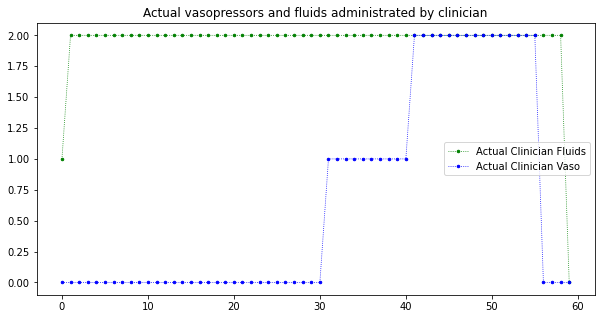

In [ ]:
title='Clinician '+str(pat)
plot_clinician_actions(pat,save_title=title)

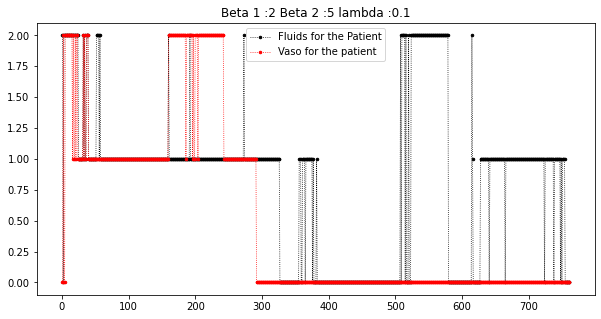

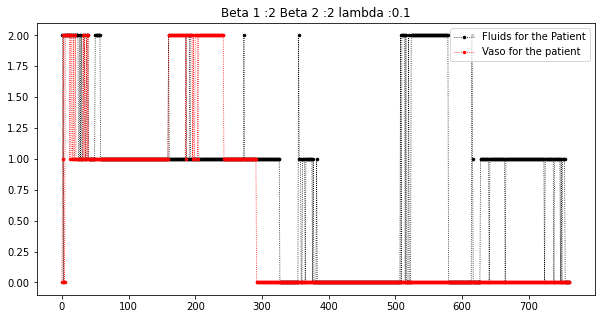

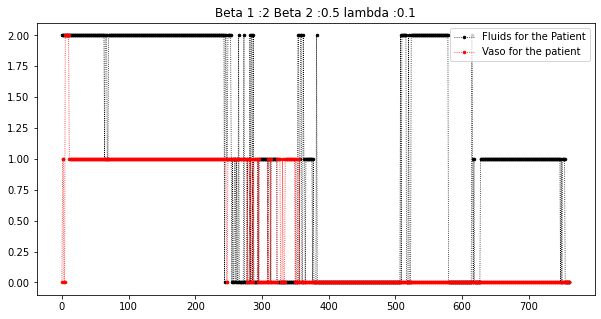

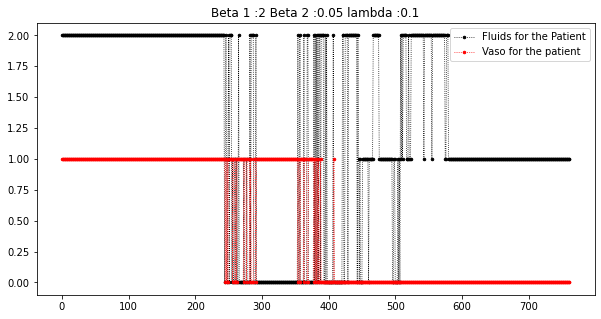

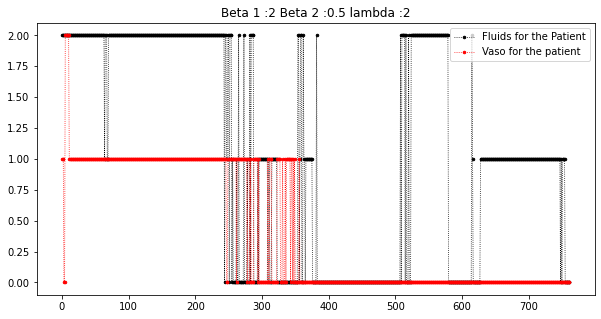

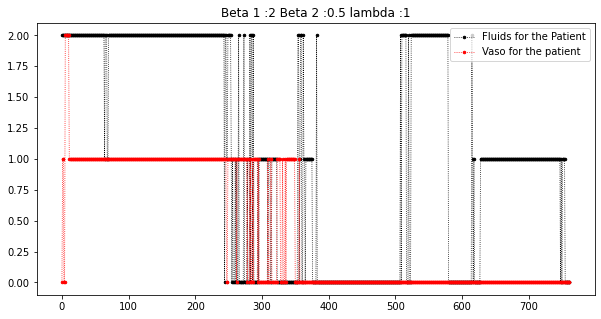

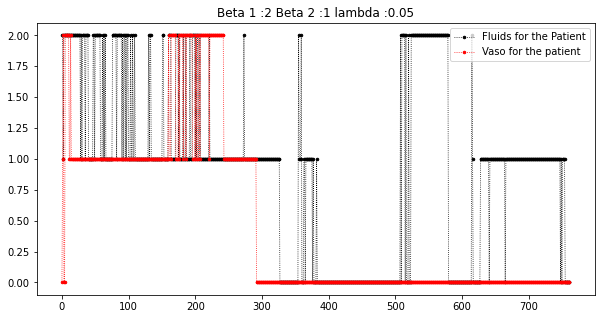

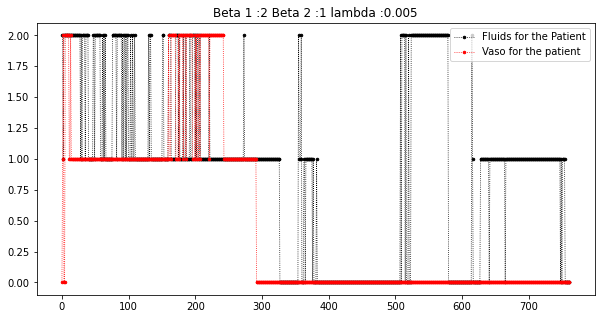

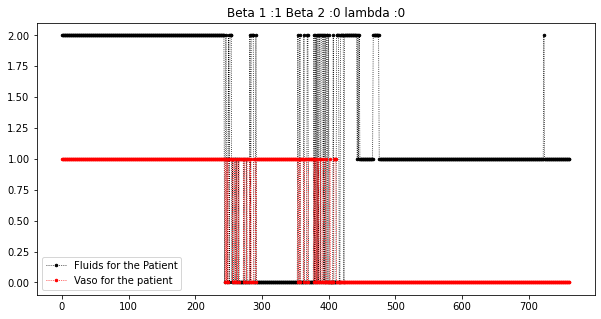

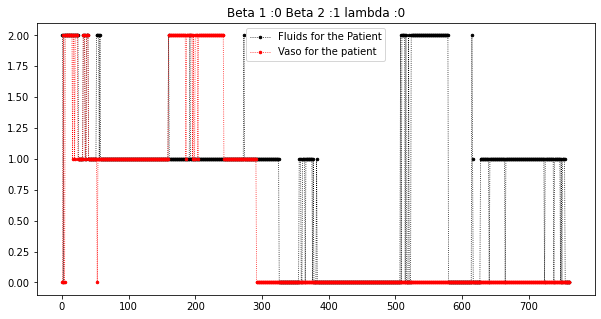

In [ ]:
pat=253145
params=[(2,5,0.1),(2,2,0.1),(2,0.5,0.1),(2,0.05,0.1),(2,0.5,2),(2,0.5,1),(2,1,0.05),(2,1,0.005),(1,0,0),(0,1,0)]
# params=[(2,5,0.1),(2,2,0.1),(2,0.5,0.1),(2,0.05,0.1),(2,0.5,2),(2,0.5,1),(2,1,0.05),(2,1,0.005),(1,0,0),(0,1,0)]
for i,param in enumerate(params):
  title=str(pat)+' '+str(i)
  plot_feature_treat(pat,beta1=param[0],beta2=param[1],lam=param[2],save_title=title)

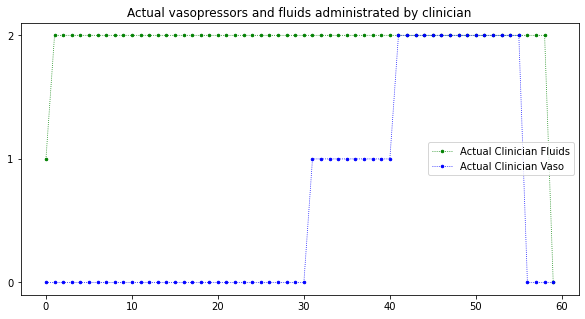

In [ ]:
pat=263969
title='Clinician '+str(pat)
plot_clinician_actions(pat,save_title=title)

In [35]:
def plot_outputs(pat,params,save_file=False):
  fig = plt.figure(figsize=(30,50))
  pat_df=df[df.Pat==pat]
  state=torch.FloatTensor(df[df.Pat==pat].iloc[:,:41].values).to(device)
  acts=[(0,0),(0,1),(0,2),(1,0),(1,1),(1,2),(2,0),(2,1),(2,2)] 
  for i in range(1, len(params)+1):
    
    ax = fig.add_subplot(5,2, i)
    legends = ['Fluids for the Patient','Vaso for the patient']
    
    
    action,_=ensm.uncertainty_aware_actions(state,params[i-1][0],params[i-1][1],params[i-1][2])
    fluids_pat=[acts[action[i]][1] for i in range(action.shape[0])]
    vaso_pat=[acts[action[i]][0] for i in range(action.shape[0])]

    ax.plot(np.arange(pat_df.shape[0]),fluids_pat,'k',linestyle='dotted',linewidth=1.2,label=legends[0],marker=".",markersize=8)
    ax.plot(np.arange(pat_df.shape[0]),vaso_pat,'r',linestyle='dotted',linewidth=1.2,label=legends[1],marker=".",markersize=8)
    ax.set_yticks([0,1,2])

    beta1,beta2,lam=params[i-1]
    title='Beta 1 :'+ str(beta1)+' Beta 2 :'+ str(beta2)+' lambda :'+str(lam)
    plt.title(title)
    plt.legend()

  if save_file:
    plt.savefig(save_file)


   
        
  
 
  

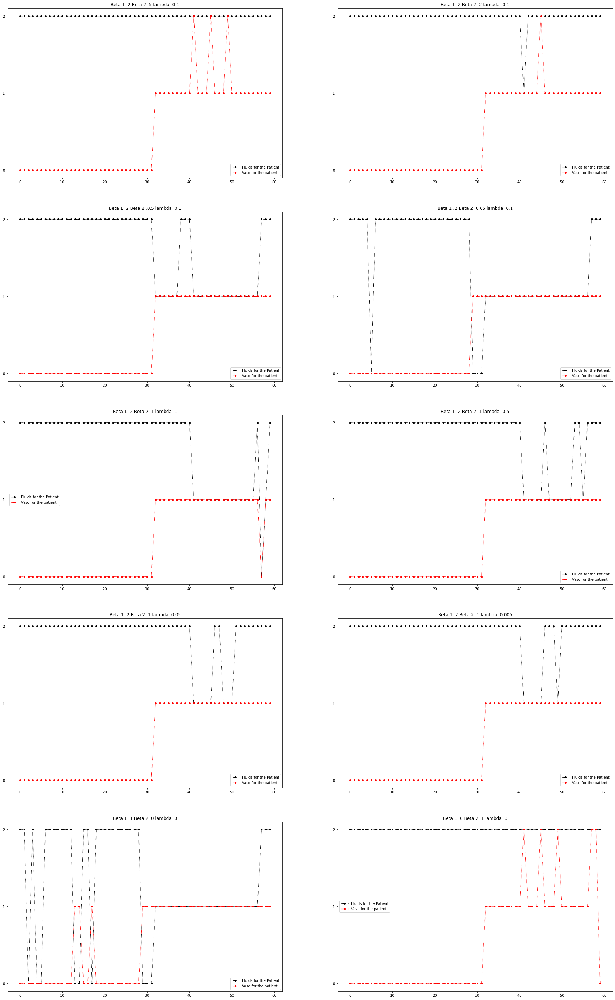

In [ ]:
pat=263969
params=[(2,5,0.1),(2,2,0.1),(2,0.5,0.1),(2,0.05,0.1),(2,1,1),(2,1,0.5),(2,1,0.05),(2,1,0.005),(1,0,0),(0,1,0)]
plot_outputs(pat,params,save_file='253145_subplots.jpg')

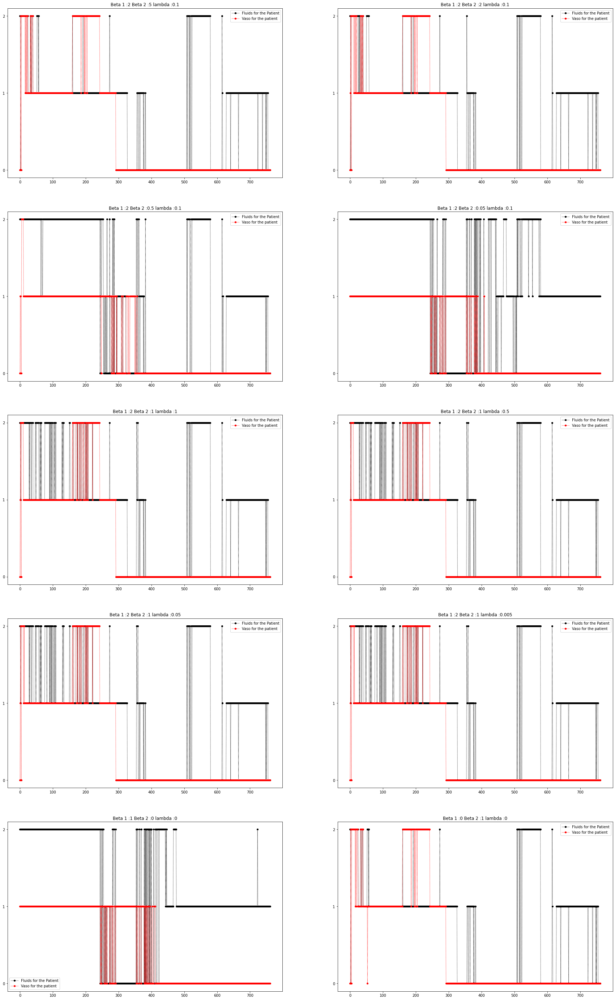

In [ ]:
pat=253145
params=[(2,5,0.1),(2,2,0.1),(2,0.5,0.1),(2,0.05,0.1),(2,1,1),(2,1,0.5),(2,1,0.05),(2,1,0.005),(1,0,0),(0,1,0)]
plot_outputs(pat,params,save_file='253145_subplots.jpg')

#Next Goal : Global Analysis : Value distributions for death in Validation

In [22]:
from torch.utils.data import TensorDataset
ds=TensorDataset(torch.Tensor(df.iloc[:,:41].values))
val_ds=TensorDataset(torch.Tensor(val_df.iloc[:,:41].values))

train_loader=DataLoader(ds,batch_size=256,shuffle=False)
val_loader=DataLoader(val_ds,batch_size=256,shuffle=False)

In [ ]:
actions=[]
Vals=[]
un=[]
for i,state in enumerate(train_loader):
  state=state[0]
  # action,_=ensm.uncertainty_aware_actions(state,beta1=2,beta2=0,lam=0)
  # actions.append(action.detach().cpu().numpy())
  value=ensm.get_ensemble_exp_values(state).max(1)[0]
  Vals.append(value.detach().cpu().numpy())
  print(i*100/(len(train_loader)))

# acts=np.hstack(actions)
vals=np.hstack(Vals)

In [106]:
act_df['value']=vals

In [93]:
acts_map=[(0,0),(0,1),(0,2),(1,0),(1,1),(1,2),(2,0),(2,1),(2,2)] 

In [94]:
fluids=[acts_map[acts[i]][1] for i in range(acts.shape[0])]
vaso=[acts_map[acts[i]][0] for i in range(acts.shape[0])]

In [95]:
act_df['Exp_Vaso']=vaso
act_df['Exp_Fluids']=fluids

In [97]:
ls ../

actions2.csv        dist_17_atoms_5.pt  dist_v2_10.pt  dist_v2_6.pt
actions.csv         dist_noW1.pt        dist_v2_11.pt  dist_v2_7.pt
dist_17_atoms_1.pt  dist_noW2.pt        dist_v2_2.pt   dist_v2_8.pt
dist_17_atoms_2.pt  dist_noW3.pt        dist_v2_3.pt   dist_v2_9.pt
dist_17_atoms_3.pt  dist_noW4.pt        dist_v2_4.pt   images/
dist_17_atoms_4.pt  dist_v2_0.pt        dist_v2_5.pt   new/


In [107]:
act_df.to_csv('../actions.csv')

In [96]:
act_df.head()

,Clinician Vaso,Clinician Fluids,dist 2 1 0.05 Vaso,dist 2 1 0.05 Fluids,SOFA,Pat,Exp_Vaso,Exp_Fluids
0,0,0,0,0,0.0,262147,0,2
1,0,0,0,0,2.0,262147,0,2
2,0,0,0,0,5.0,262147,0,2
3,0,0,0,0,5.0,262147,0,2
4,0,0,0,0,5.0,262147,0,2


In [72]:
SOFA=pd.read_csv('../../../../RL_new.csv', usecols=["SOFA"])

In [74]:
df['SOFA_'],act_df['SOFA']=SOFA,SOFA

In [87]:
act_df['Pat']=df.Pat

In [99]:
low_sofa=act_df[act_df.SOFA<5]
high_sofa=act_df[act_df.SOFA>=15]
med_sofa=act_df[act_df.SOFA.isin(np.arange(5,15))]
med_sofa.shape[0]+high_sofa.shape[0]+low_sofa.shape[0]
dead_df=act_df[act_df.Pat.isin(df[df.Rewards==-15].Pat)]

In [ ]:

Titles=['Clinician','Overall','Low SOFA Clinician','Low SOFA Agent','Med SOFA Clinician','Med SOFA Agent',
          'High SOFA Clinician','High SOFA Agent','Non Survivors Clinician', 'Non Survivors Agent']
plt.figure(figsize=(30,10))
cols=[('Clinician Vaso','Clinician Fluids'),('dist 2 1 0.05 Vaso','dist 2 1 0.05 Fluids')]*5
df_list=[act_df]*2+[low_sofa]*2+[med_sofa]*2+[high_sofa]*2+[dead_df]*2
cmaps=[plt.cm.Oranges]*2+[plt.cm.Greens]*2+[plt.cm.Blues]*2+[plt.cm.Purples]*2+[plt.cm.Reds]*2
for i in range(1,11):
   df_=df_list[i-1]
   plt.subplot(2,5,i)
   plt.title(Titles[i-1], fontsize=8)
   plt.hist2d(df_[cols[i-1][0]],df_[cols[i-1][1]],bins=np.arange(4),density=False,cmap=cmaps[i-1])
   plt.colorbar()
   plt.xlabel('Vasopressor Bin')
   plt.ylabel('Fluid Bin')
    # plt.grid()


 


In [ ]:

Titles=['Clinician','Overall','Low SOFA Clinician','Low SOFA Agent','Med SOFA Clinician','Med SOFA Agent',
          'High SOFA Clinician','High SOFA Agent','Non Survivors Clinician', 'Non Survivors Agent']
plt.figure(figsize=(30,10))
cols=[('Clinician Vaso','Clinician Fluids'),('Exp_Vaso','Exp_Fluids')]*5
df_list=[act_df]*2+[low_sofa]*2+[med_sofa]*2+[high_sofa]*2+[dead_df]*2
cmaps=[plt.cm.Oranges]*2+[plt.cm.Greens]*2+[plt.cm.Blues]*2+[plt.cm.Purples]*2+[plt.cm.Reds]*2
for i in range(1,11):
   df_=df_list[i-1]
   plt.subplot(2,5,i)
   plt.title(Titles[i-1], fontsize=8)
   plt.hist2d(df_[cols[i-1][0]],df_[cols[i-1][1]],bins=np.arange(4),density=False,cmap=cmaps[i-1])
   plt.colorbar()
   plt.xlabel('Vasopressor Bin')
   plt.ylabel('Fluid Bin')
    # plt.grid()


 


In [ ]:
actions=[]
Vals=[]
un=[]
for i,state in enumerate(val_loader):
  state=state[0]
  # action,_=ensm.uncertainty_aware_actions(state,beta1=2,beta2=0,lam=0)
  # actions.append(action.detach().cpu().numpy())
  # value=ensm.get_ensemble_exp_values(state).max(1)[0]
  value=ensm.get_ensemble_exp_values(state)
  Vals.append(value.detach().cpu().numpy())
  print(i*100/(len(val_loader)))

# # acts=np.hstack(actions)
# vals=np.hstack(Vals)

In [117]:
temp=np.vstack(Vals)

In [118]:
for i in range(9):
  name='Values for action {}'.format(i)
  val_analysis[name]=temp[:,i]

In [ ]:
val_analysis

## Validation Value function and related things

In [120]:
val_analysis.to_csv('../val_analysis.csv')

In [121]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

In [123]:
val_analysis

,0,Values for action 0,Values for action 1,Values for action 2,Values for action 3,Values for action 4,Values for action 5,Values for action 6,Values for action 7,Values for action 8
0,8.835449,8.748805,8.831100,8.835449,8.833195,8.807275,8.795188,8.806792,8.826856,8.797023
1,8.853376,8.834803,8.847116,8.853376,8.844728,8.818573,8.813801,8.833139,8.842307,8.815096
2,8.828559,8.778971,8.823126,8.828559,8.824224,8.797963,8.785577,8.804597,8.819849,8.791428
3,8.782556,8.751053,8.775894,8.782556,8.774442,8.746902,8.735905,8.759402,8.770282,8.742931
4,8.835706,8.795829,8.829913,8.835706,8.828749,8.802198,8.793740,8.811966,8.824739,8.796092
...,...,...,...,...,...,...,...,...,...,...
101494,13.705692,13.705692,13.653428,13.646883,13.614445,13.612778,13.590775,13.633944,13.620869,13.606278
101495,13.667797,13.667797,13.615984,13.609571,13.575390,13.574591,13.552210,13.595653,13.582342,13.566394
101496,13.716481,13.716481,13.664139,13.657415,13.625113,13.623364,13.600759,13.644760,13.631458,13.617297
101497,13.589655,13.589655,13.538747,13.532436,13.494171,13.494666,13.469741,13.515970,13.501986,13.484224


In [125]:
X=val_df.iloc[:,:41].values
y=val_analysis.iloc[:,0].values

In [127]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [139]:
rf=RandomForestRegressor()
rf.fit(X_train,y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [140]:
rf.score(X_train,y_train),rf.score(X_test,y_test)

(0.9968965460493218, 0.9726448520395746)

In [ ]:
plt.figure(figsize=(20,20))
plt.bar(x=np.arange(41),height=rf.feature_importances_,tick_label=list(val_df.columns[:41]))

In [ ]:
val_df['CO/R']=val_df.CO/val_df.R